# Supplementary Figure - Velocity Transform

In [1]:
folder = 'figs-2022-5-26/'

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FixedLocator,FixedFormatter
import matplotlib.pylab as pylab

# analysis
from sklearn.decomposition import PCA, FactorAnalysis
from sklearn.linear_model import LinearRegression
from scipy import interpolate # don't import stats
from scipy import linalg as LA
from scipy.ndimage.filters import uniform_filter1d

# miscellaneous
from tqdm import tqdm
from itertools import cycle
from copy import deepcopy
import pickle

import logging
import warnings
import dataclasses
from dataclasses import dataclass
from typing import Optional, List

import sys
sys.path.append("../..")

In [3]:
from rnn import RNNparams, RNN
from task import Task
from simulation import Simulation
from algorithms.bptt import BPTT
from algorithms.rflo import RFLO
from algorithms.reinforce import REINFORCE
from algorithms.track_vars import TrackVars

from utils.plotting import plot_trained_trajectories, paper_format
from utils.metric import cos_sim, return_norm_and_angle
from utils.functions import choose_aligned_matrix

from utils.metric import cos_sim, flow_field_data, flow_field_predicted, calculate_flow_field_correlation


# RFLO with velocity transform, with varied M

In [4]:
trial_duration = 20
n_in=4
frac_on = 0.2

x_tonic = 0.0*np.ones((trial_duration, n_in)) # shape 20 x 4 i.e. time x channel
x_pulse1 = x_tonic.copy()
x_pulse2 = x_tonic.copy()
x_pulse3 = x_tonic.copy()
x_pulse4 = x_tonic.copy()
x_pulse1[0:int(trial_duration*frac_on),0] = 1
x_pulse2[0:int(trial_duration*frac_on),1] = 1
x_pulse3[0:int(trial_duration*frac_on),2] = 1
x_pulse4[0:int(trial_duration*frac_on),3] = 1

task1 = Task(x_in=x_pulse1,y_target=np.asarray([[1],[1]]))
task2 = Task(x_in=x_pulse2,y_target=np.asarray([[-1],[1]]))
task3 = Task(x_in=x_pulse3,y_target=np.asarray([[1],[-1]]))
task4 = Task(x_in=x_pulse4,y_target=np.asarray([[-1],[-1]]))

3it [00:00, 27.90it/s]

n_in: 4
n_rec: 50
n_out: 2
sig_in: 0.0
sig_rec: 0.25
sig_out: 0.01
tau_rec: 10
dt: 1.0
eta_in: 0.1
eta_rec: 0.2
eta_out: 0.1
g_in: 2.0
g_rec: 1.5
g_out: 2.0
g_fb: 2.0
driving_feedback: False
eta_fb: None
sig_fb: None
feedback_signal: position
velocity_transform: False
tau_vel: 0.8
dt_vel: 0.1
sig_rec_dim: None
eta_m: None
sig_m: None
lam_m: None
rng: <mtrand.RandomState object at 0x7fa1ee82e048>


3000it [00:34, 86.13it/s]


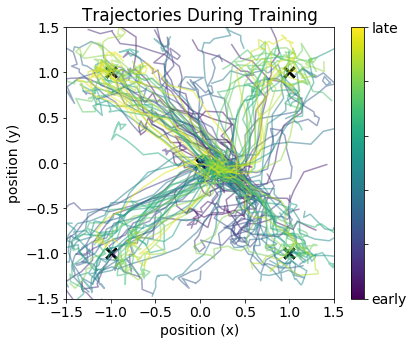

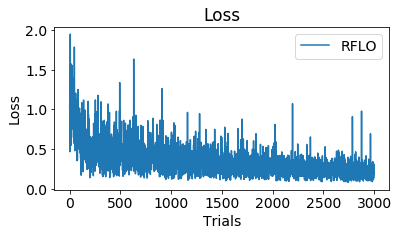

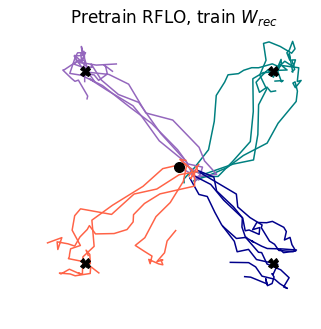

In [6]:
rnn_seed = 72
pretrain_duration = 3000
train_duration = 3000
test_duration = 500


# Set RNN Parameters
params = RNNparams(n_in=4,n_rec=50,n_out=2,tau_rec=10,
               eta_in=0.1,eta_rec=0.2,eta_out=0.1,
               sig_in=0.0,sig_rec=0.25,sig_out=0.01,
               velocity_transform=False, tau_vel = 0.8, dt_vel = 0.1,
               rng=np.random.RandomState(rnn_seed))
params.print_params()


    
# Initialize RNN
net0 = RNN(params)
sim0 = Simulation(net0)
rflo = RFLO(net0,apply_to=['w_rec'],online=False,error_fn='distance')
sim0.run_session(n_trials=pretrain_duration, tasks=[task1,task2,task3,task4], learn_alg=[rflo], probe_types=['loss'], plot=True, plot_freq=20)

fig0 = plot_trained_trajectories(sim=sim0, tasks=[task1,task2,task3,task4],title='Pretrain RFLO, train '+r'$W_{rec}$')


4it [00:00, 39.64it/s]

n_in: 4
n_rec: 50
n_out: 2
sig_in: 0.0
sig_rec: 0.25
sig_out: 0.01
tau_rec: 10
dt: 1.0
eta_in: 0.1
eta_rec: 0.1
eta_out: 0.1
g_in: 2.0
g_rec: 1.5
g_out: 2.0
g_fb: 2.0
driving_feedback: False
eta_fb: None
sig_fb: None
feedback_signal: position
velocity_transform: True
tau_vel: 0.8
dt_vel: 0.1
sig_rec_dim: None
eta_m: None
sig_m: None
lam_m: None
rng: <mtrand.RandomState object at 0x7f9766f34a20>


2500it [00:33, 74.89it/s]
4it [00:00, 37.30it/s]

M norm: 1.32	 M angle: 0.41, 113 iterations
w_out1 norm: 1.52	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.32	 w_out1 vs. w_m angle: 0.41
w_m norm: 1.84	 w_out vs. w_m angle: 0.15

500it [00:05, 92.42it/s] 
3000it [00:38, 78.90it/s]
500it [00:04, 103.91it/s]


AR early fit 0.931, late fit 0.974


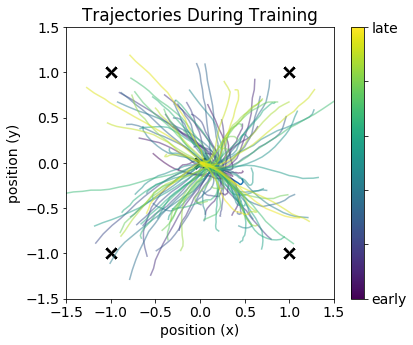

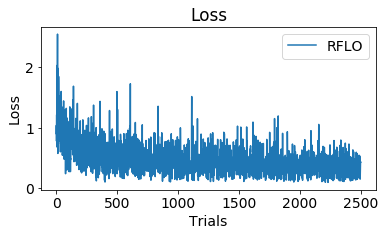

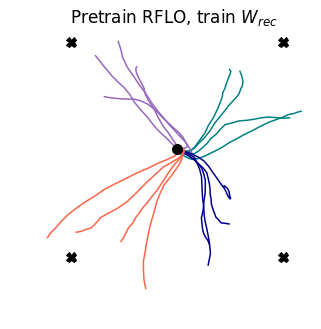

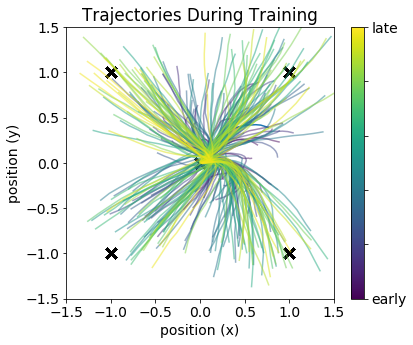

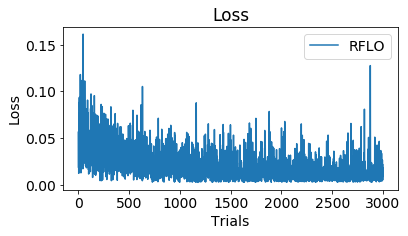

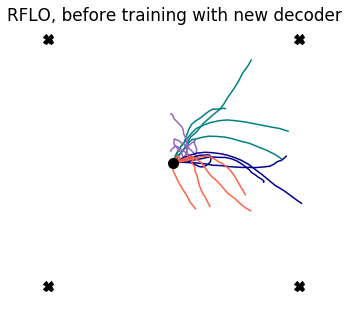

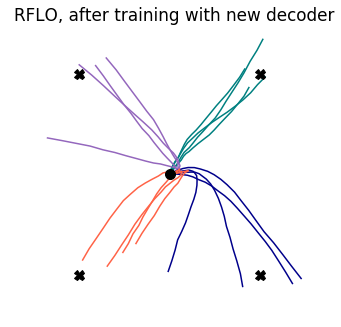

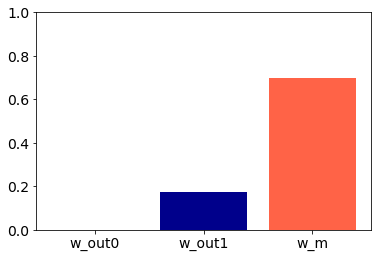

9it [00:00, 89.63it/s]

M norm: 1.21	 M angle: 0.49, 34 iterations
w_out1 norm: 1.52	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.21	 w_out1 vs. w_m angle: 0.49
w_m norm: 1.85	 w_out vs. w_m angle: 0.11

500it [00:04, 115.50it/s]
3000it [00:32, 91.24it/s]
500it [00:04, 117.00it/s]


AR early fit 0.931, late fit 0.965


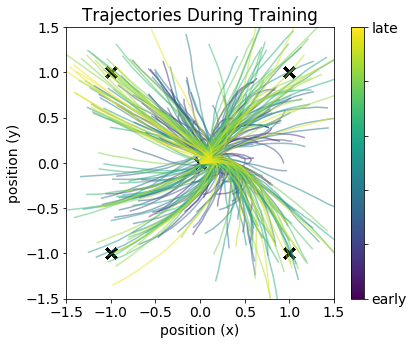

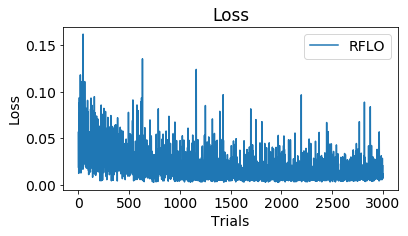

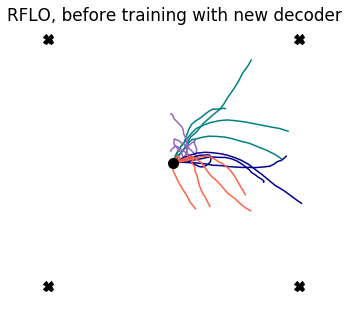

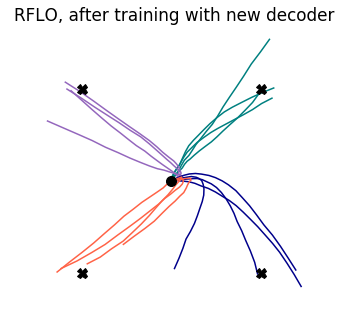

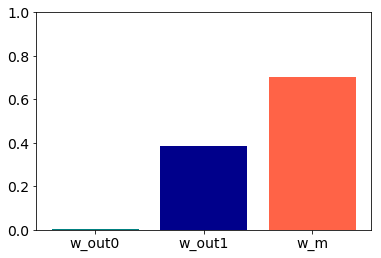

7it [00:00, 66.71it/s]

M norm: 1.11	 M angle: 0.60, 12 iterations
w_out1 norm: 1.52	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.11	 w_out1 vs. w_m angle: 0.60
w_m norm: 1.72	 w_out vs. w_m angle: 0.29

500it [00:04, 110.10it/s]
3000it [00:35, 83.35it/s]
500it [00:04, 122.12it/s]


AR early fit 0.931, late fit 0.972


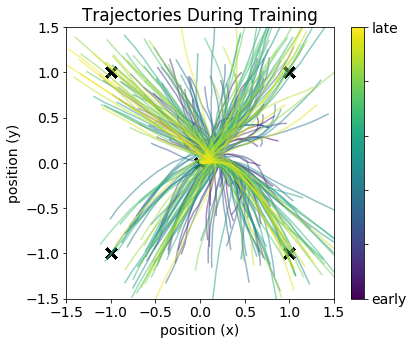

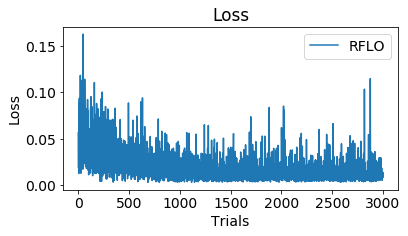

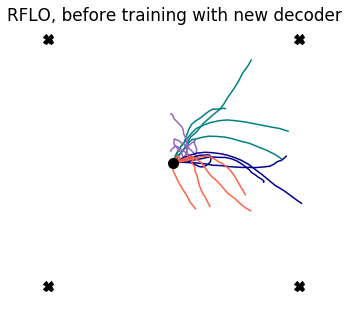

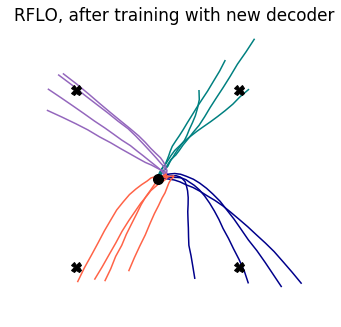

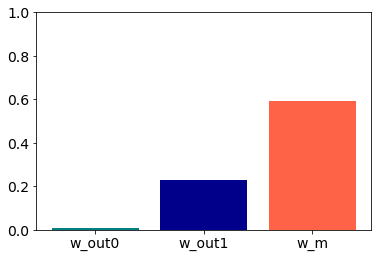

8it [00:00, 74.16it/s]

M norm: 0.97	 M angle: 0.70, 4 iterations
w_out1 norm: 1.52	 w_out vs. w_out1 angle: 0.51
w_m norm: 0.97	 w_out1 vs. w_m angle: 0.70
w_m norm: 1.67	 w_out vs. w_m angle: 0.33

500it [00:04, 116.19it/s]
3000it [00:34, 87.46it/s]
500it [00:04, 118.02it/s]


AR early fit 0.931, late fit 0.968


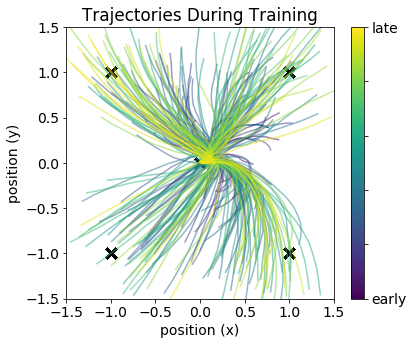

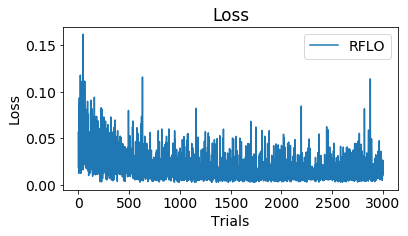

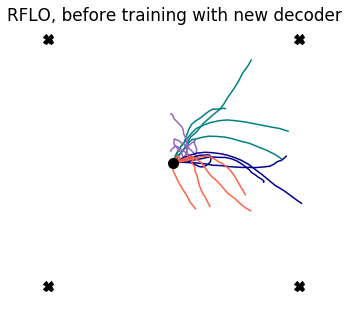

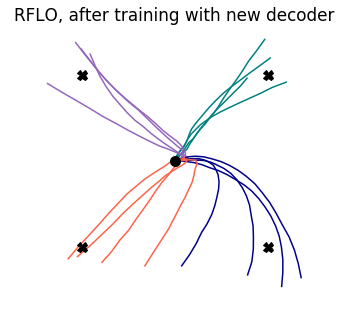

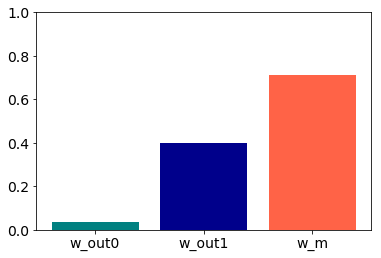

9it [00:00, 88.97it/s]

M norm: 0.80	 M angle: 0.81, 2 iterations
w_out1 norm: 1.52	 w_out vs. w_out1 angle: 0.51
w_m norm: 0.80	 w_out1 vs. w_m angle: 0.81
w_m norm: 1.69	 w_out vs. w_m angle: 0.35

500it [00:04, 108.13it/s]
3000it [00:33, 89.83it/s]
500it [00:04, 111.07it/s]


AR early fit 0.931, late fit 0.963


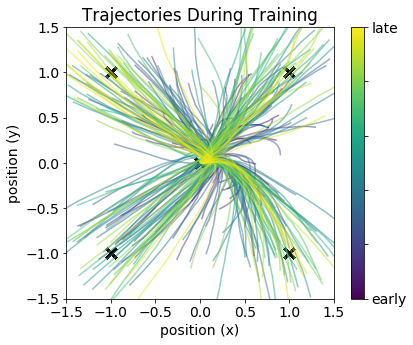

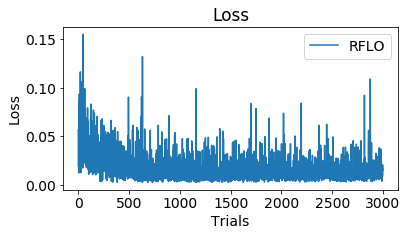

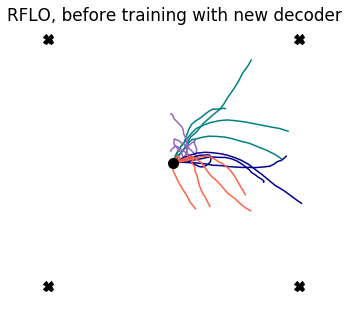

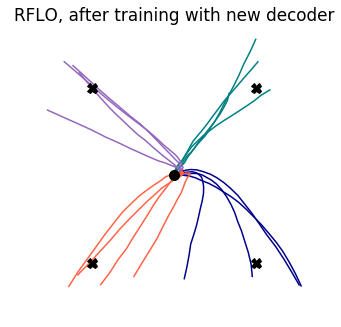

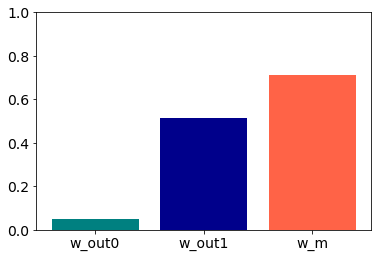

9it [00:00, 87.40it/s]

M norm: 0.56	 M angle: 0.91, 29 iterations
w_out1 norm: 1.52	 w_out vs. w_out1 angle: 0.51
w_m norm: 0.56	 w_out1 vs. w_m angle: 0.91
w_m norm: 1.63	 w_out vs. w_m angle: 0.40

500it [00:04, 115.58it/s]
3000it [00:35, 83.93it/s]
500it [00:04, 115.90it/s]


AR early fit 0.931, late fit 0.960


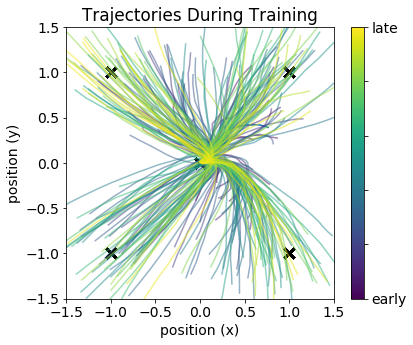

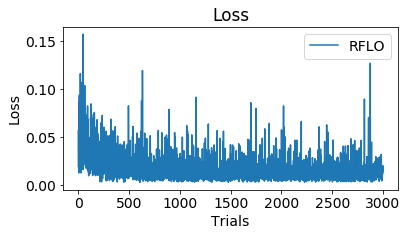

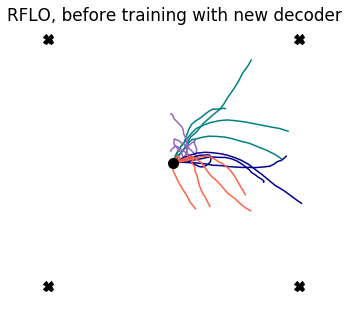

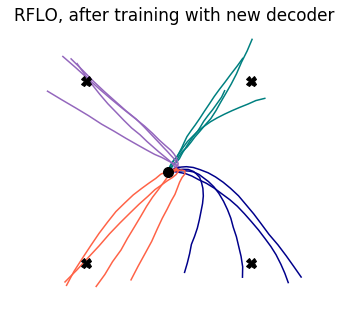

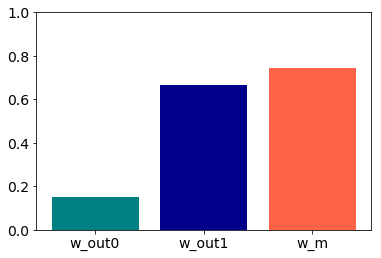

10it [00:00, 98.09it/s]

M norm: 0.00	 M angle: 1.00, 0 iterations
w_out1 norm: 1.52	 w_out vs. w_out1 angle: 0.51
w_m norm: 0.00	 w_out1 vs. w_m angle: 1.00
w_m norm: 1.52	 w_out vs. w_m angle: 0.51

500it [00:04, 112.45it/s]
3000it [00:32, 92.38it/s]
500it [00:04, 124.25it/s]


AR early fit 0.931, late fit 0.958


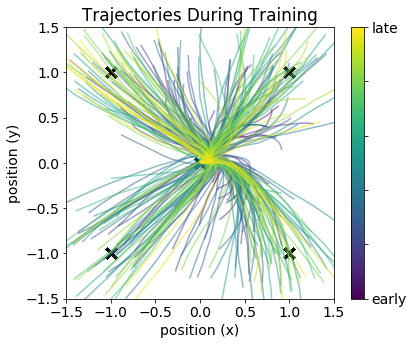

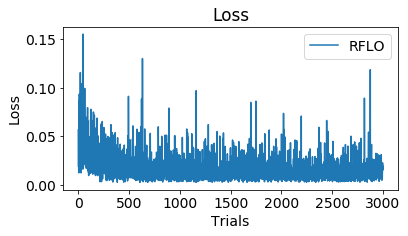

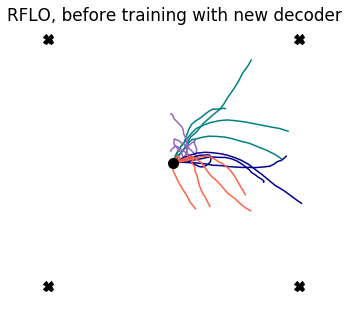

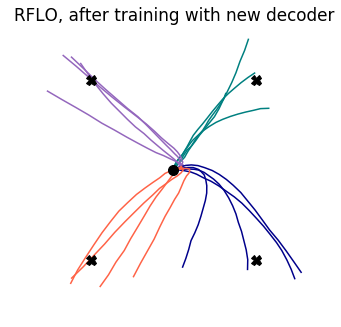

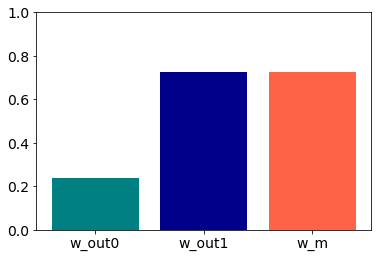

7it [00:00, 61.81it/s]

M norm: 1.18	 M angle: 0.39, 47 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.18	 w_out1 vs. w_m angle: 0.39
w_m norm: 1.78	 w_out vs. w_m angle: 0.12

500it [00:04, 123.11it/s]
3000it [00:32, 93.57it/s]
500it [00:04, 122.67it/s]


AR early fit 0.931, late fit 0.975


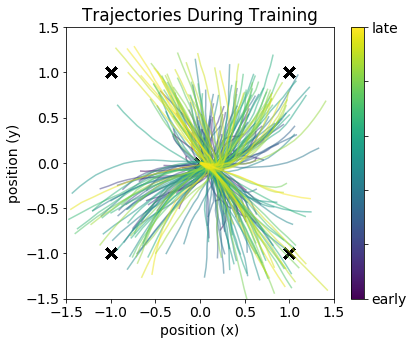

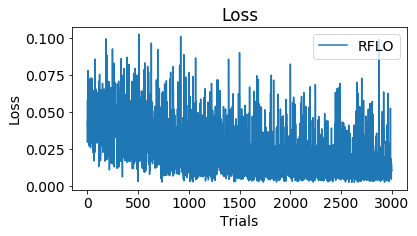

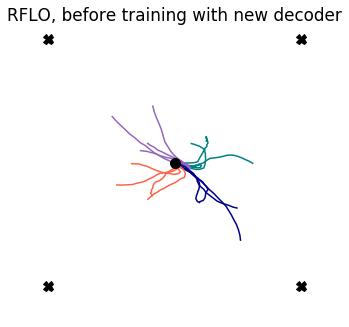

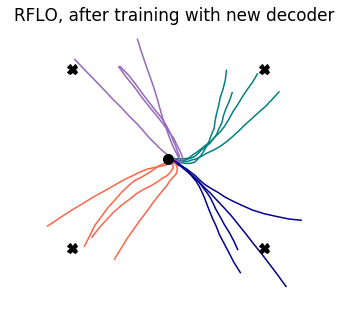

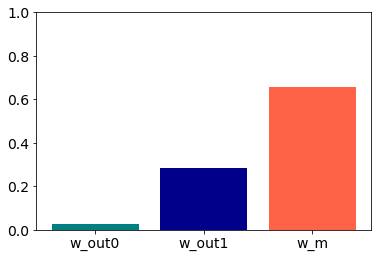

8it [00:00, 75.27it/s]

M norm: 1.13	 M angle: 0.50, 5 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.13	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.76	 w_out vs. w_m angle: 0.21

500it [00:04, 124.09it/s]
3000it [00:31, 95.65it/s]
500it [00:04, 124.83it/s]


AR early fit 0.931, late fit 0.975


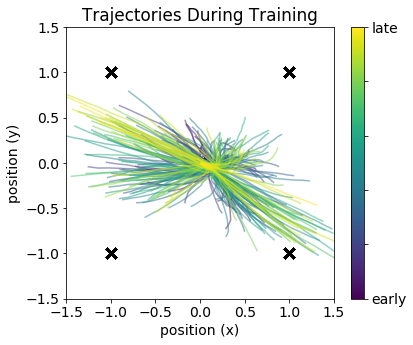

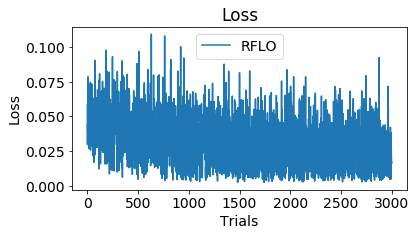

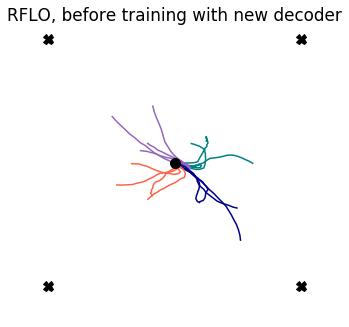

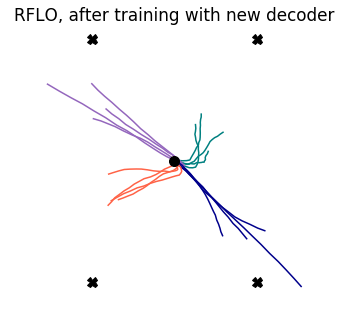

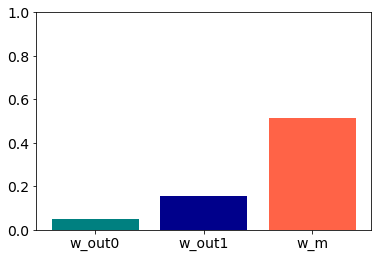

7it [00:00, 64.97it/s]

M norm: 1.01	 M angle: 0.61, 14 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.01	 w_out1 vs. w_m angle: 0.61
w_m norm: 1.67	 w_out vs. w_m angle: 0.31

500it [00:04, 123.23it/s]
3000it [00:36, 81.65it/s]
500it [00:04, 110.46it/s]


AR early fit 0.931, late fit 0.975


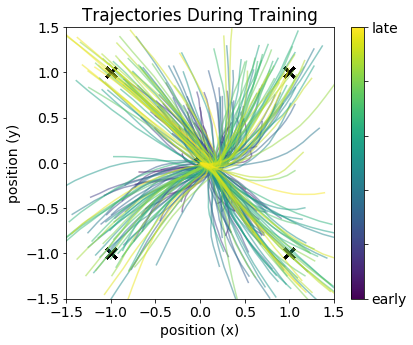

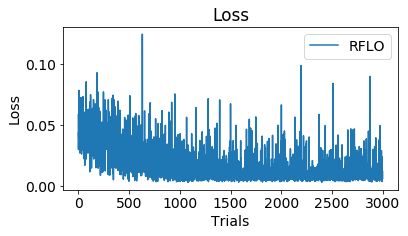

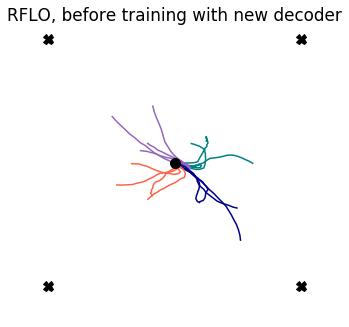

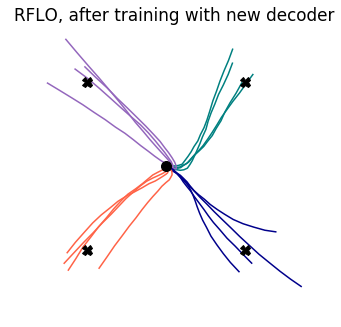

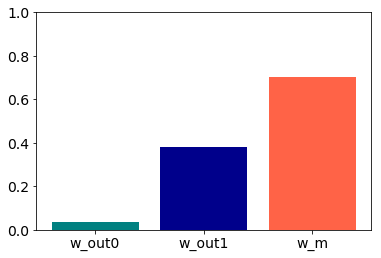

7it [00:00, 65.87it/s]

M norm: 0.89	 M angle: 0.70, 17 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 0.89	 w_out1 vs. w_m angle: 0.70
w_m norm: 1.57	 w_out vs. w_m angle: 0.41

500it [00:04, 108.16it/s]
3000it [00:31, 94.94it/s]
500it [00:04, 122.21it/s]


AR early fit 0.931, late fit 0.973


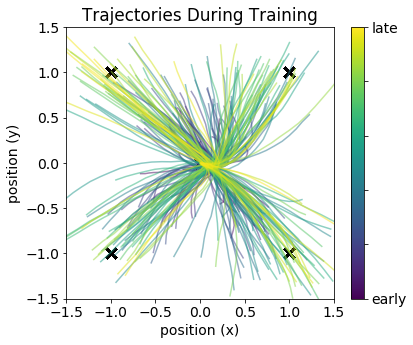

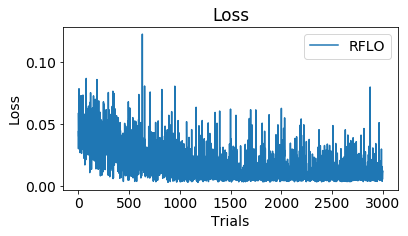

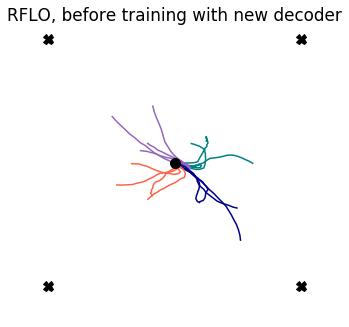

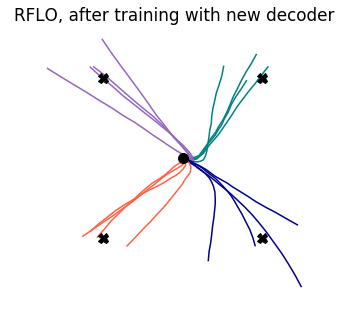

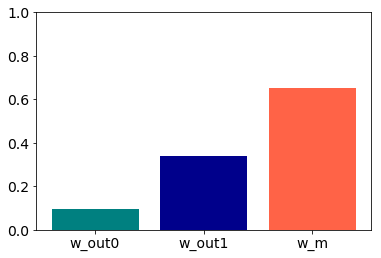

8it [00:00, 74.38it/s]

M norm: 0.73	 M angle: 0.80, 0 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 0.73	 w_out1 vs. w_m angle: 0.80
w_m norm: 1.66	 w_out vs. w_m angle: 0.33

500it [00:04, 125.66it/s]
3000it [00:33, 89.36it/s]
500it [00:04, 119.81it/s]


AR early fit 0.931, late fit 0.970


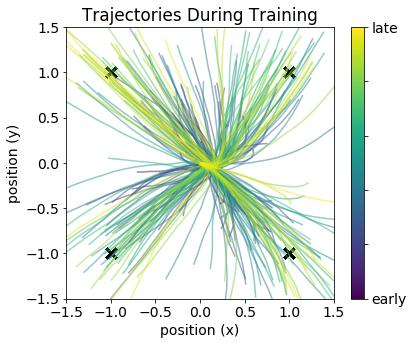

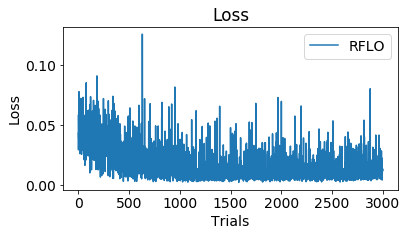

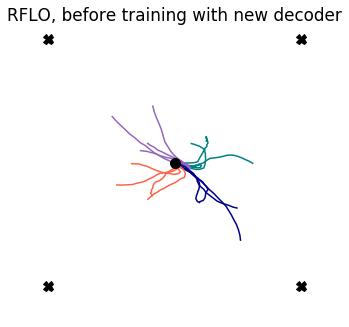

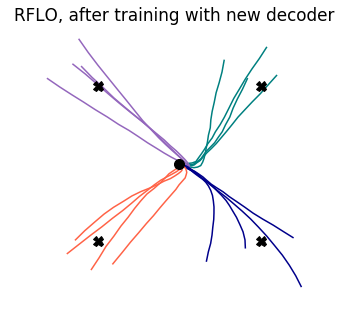

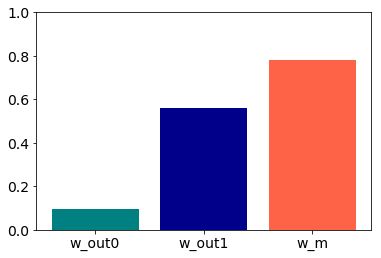

7it [00:00, 61.25it/s]

M norm: 0.53	 M angle: 0.90, 252 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 0.53	 w_out1 vs. w_m angle: 0.90
w_m norm: 1.55	 w_out vs. w_m angle: 0.45

500it [00:04, 112.24it/s]
3000it [00:33, 74.59it/s]
500it [00:04, 114.43it/s]


AR early fit 0.931, late fit 0.969


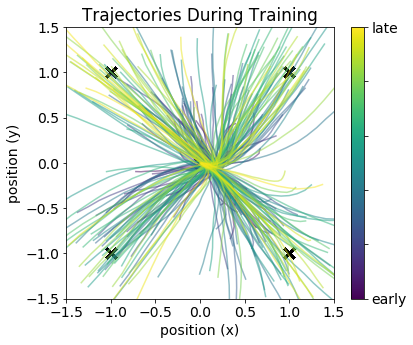

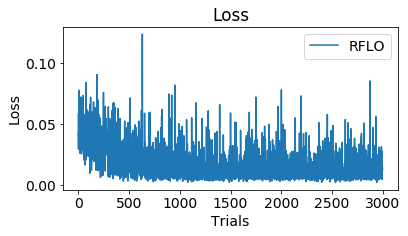

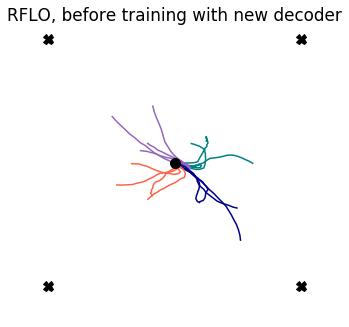

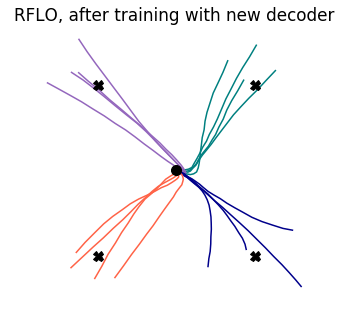

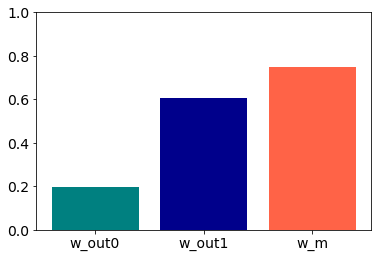

6it [00:00, 58.54it/s]

M norm: 0.00	 M angle: 1.00, 0 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 0.00	 w_out1 vs. w_m angle: 1.00
w_m norm: 1.50	 w_out vs. w_m angle: 0.50

500it [00:05, 87.35it/s]
3000it [00:37, 79.74it/s]
500it [00:05, 95.20it/s]


AR early fit 0.931, late fit 0.963


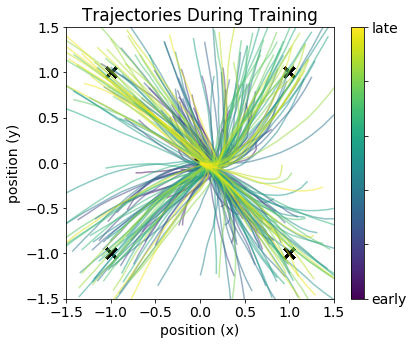

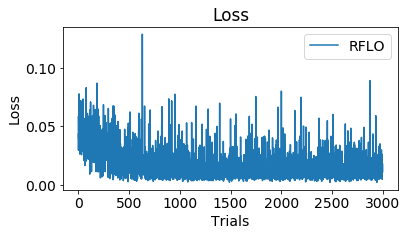

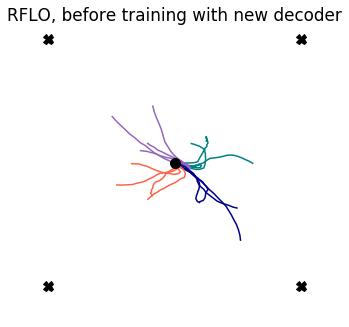

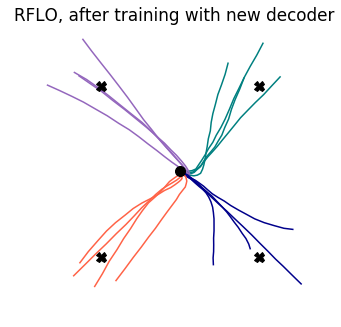

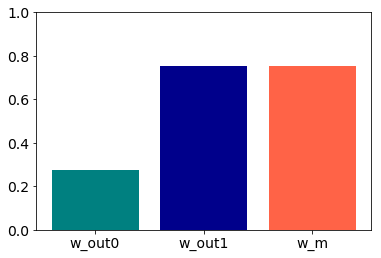

10it [00:00, 93.74it/s]

M norm: 1.28	 M angle: 0.40, 7 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.28	 w_out1 vs. w_m angle: 0.40
w_m norm: 1.77	 w_out vs. w_m angle: 0.23

500it [00:04, 117.14it/s]
3000it [00:33, 89.43it/s]
500it [00:04, 118.63it/s]


AR early fit 0.931, late fit 0.977


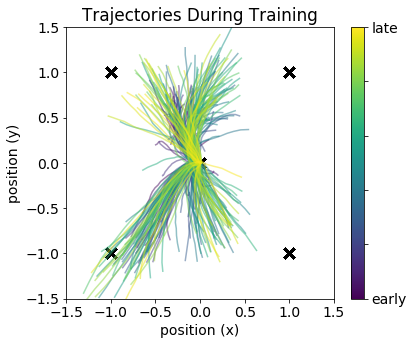

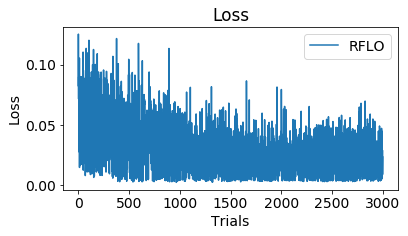

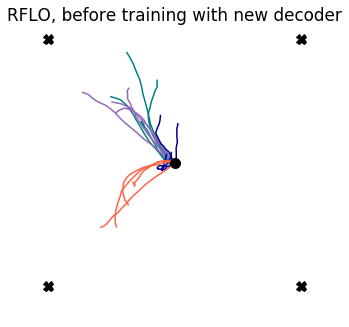

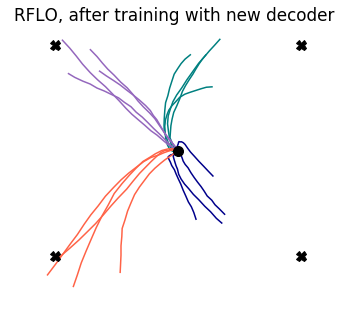

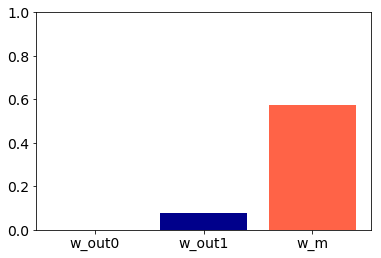

8it [00:00, 77.60it/s]

M norm: 1.14	 M angle: 0.51, 9 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.14	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.84	 w_out vs. w_m angle: 0.14

500it [00:04, 107.19it/s]
3000it [00:33, 89.71it/s]
500it [00:04, 110.27it/s]


AR early fit 0.931, late fit 0.973


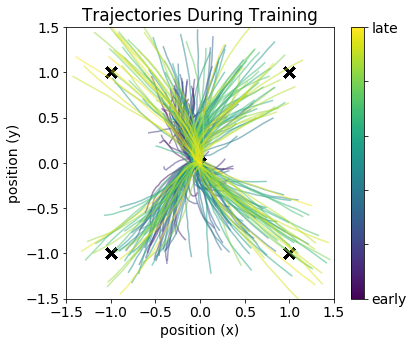

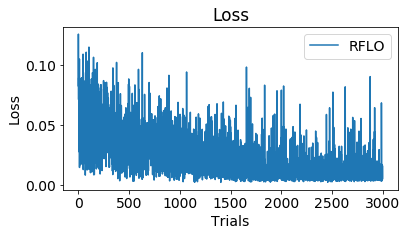

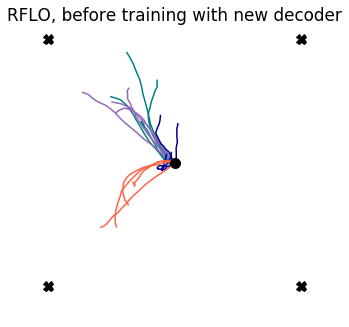

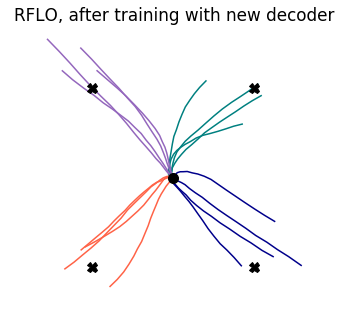

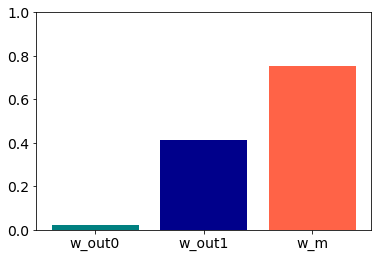

9it [00:00, 84.43it/s]

M norm: 1.07	 M angle: 0.59, 17 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.07	 w_out1 vs. w_m angle: 0.59
w_m norm: 1.64	 w_out vs. w_m angle: 0.36

500it [00:04, 100.50it/s]
3000it [00:37, 79.18it/s]
500it [00:04, 110.58it/s]


AR early fit 0.931, late fit 0.969


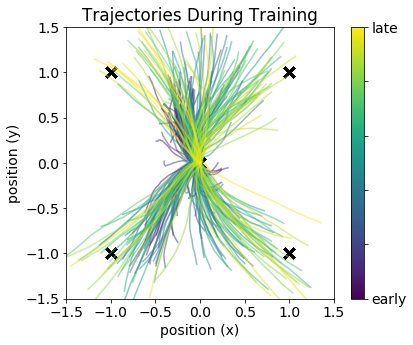

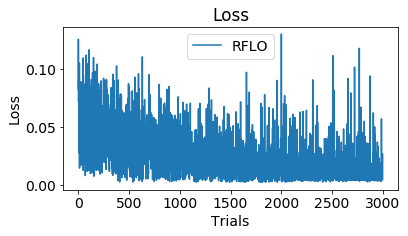

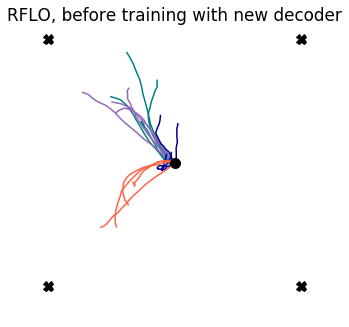

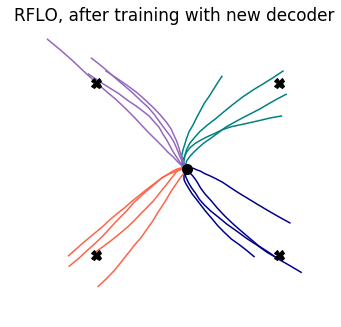

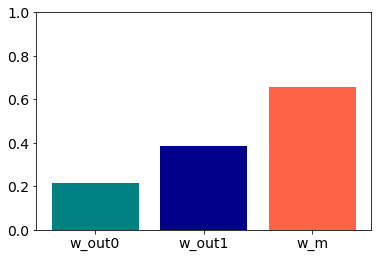

6it [00:00, 56.42it/s]

M norm: 0.93	 M angle: 0.70, 0 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 0.93	 w_out1 vs. w_m angle: 0.70
w_m norm: 1.45	 w_out vs. w_m angle: 0.52

500it [00:05, 91.27it/s] 
3000it [00:34, 88.22it/s]
500it [00:04, 105.65it/s]


AR early fit 0.931, late fit 0.968


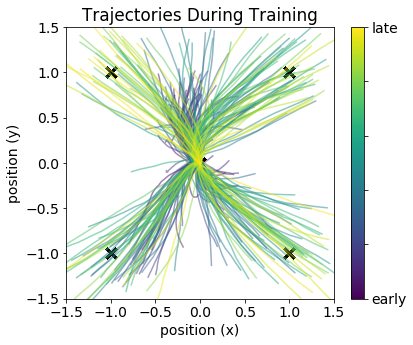

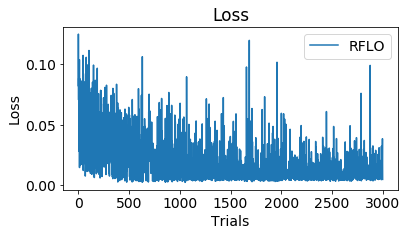

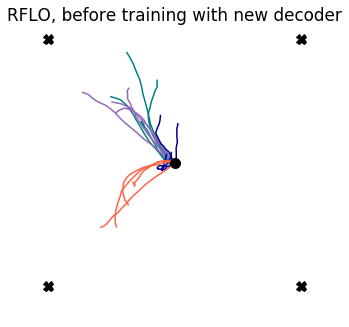

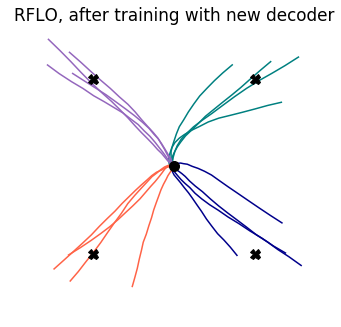

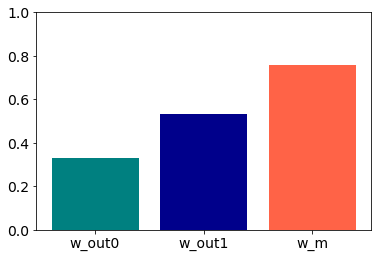

9it [00:00, 88.25it/s]

M norm: 0.76	 M angle: 0.80, 10 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 0.76	 w_out1 vs. w_m angle: 0.80
w_m norm: 1.56	 w_out vs. w_m angle: 0.43

500it [00:04, 109.83it/s]
3000it [00:33, 89.05it/s]
500it [00:06, 80.87it/s]


AR early fit 0.931, late fit 0.965


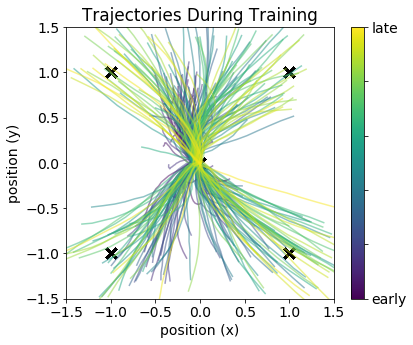

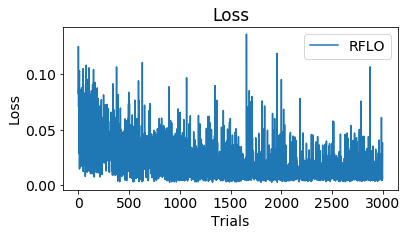

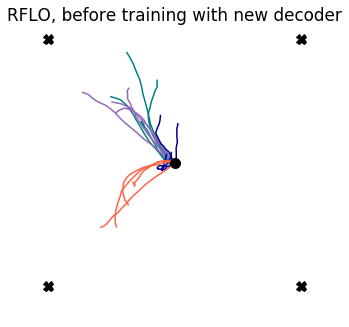

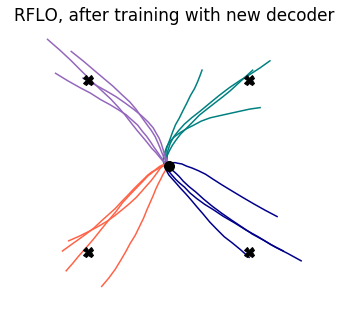

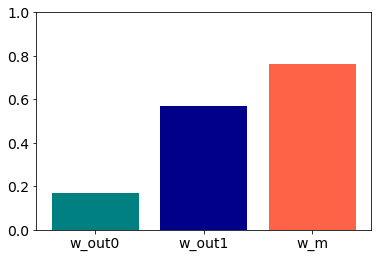

12it [00:00, 118.08it/s]

M norm: 0.54	 M angle: 0.90, 1 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 0.54	 w_out1 vs. w_m angle: 0.90
w_m norm: 1.50	 w_out vs. w_m angle: 0.50

500it [00:04, 114.62it/s]
3000it [00:33, 88.53it/s]
500it [00:04, 112.09it/s]


AR early fit 0.931, late fit 0.962


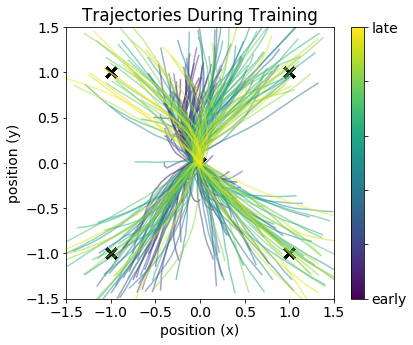

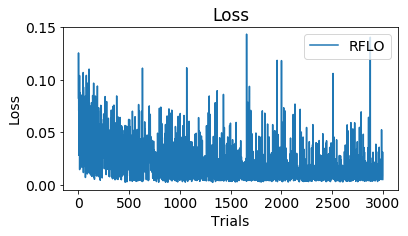

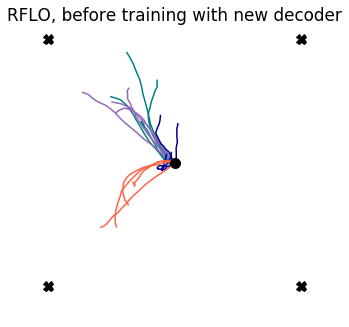

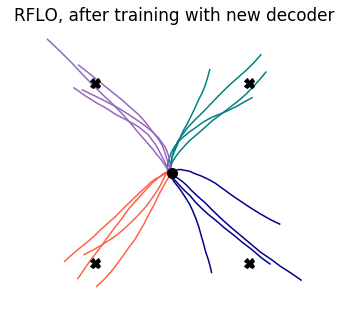

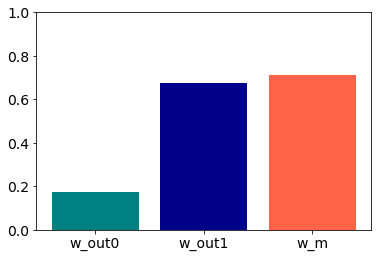

12it [00:00, 112.41it/s]

M norm: 0.00	 M angle: 1.00, 0 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 0.00	 w_out1 vs. w_m angle: 1.00
w_m norm: 1.50	 w_out vs. w_m angle: 0.50

500it [00:04, 105.44it/s]
3000it [00:35, 85.35it/s]
500it [00:04, 103.85it/s]


AR early fit 0.931, late fit 0.959


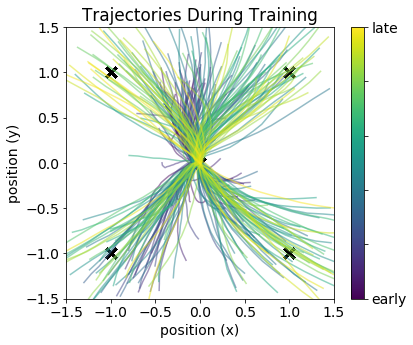

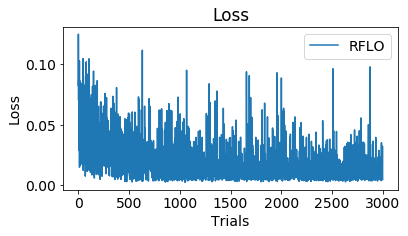

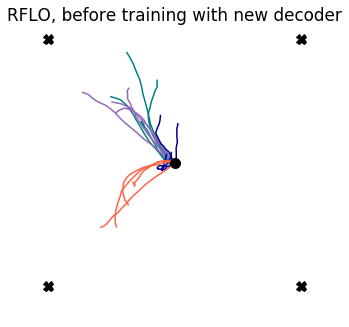

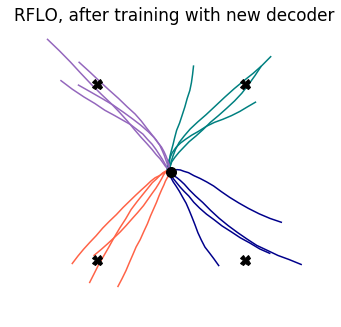

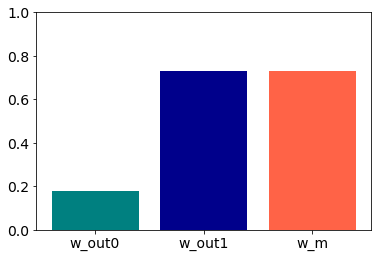

13it [00:00, 123.94it/s]

M norm: 1.17	 M angle: 0.39, 6 iterations
w_out1 norm: 1.47	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.17	 w_out1 vs. w_m angle: 0.39
w_m norm: 1.76	 w_out vs. w_m angle: 0.16

500it [00:05, 93.28it/s] 
3000it [00:34, 86.57it/s]
500it [00:04, 117.52it/s]


AR early fit 0.931, late fit 0.971


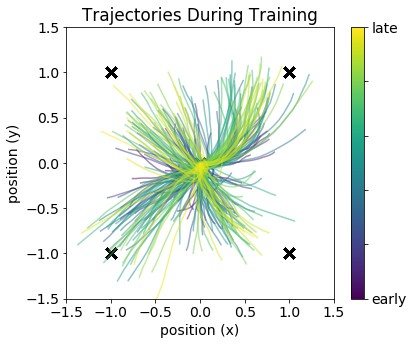

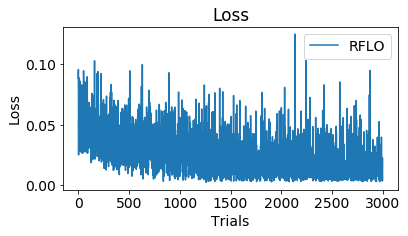

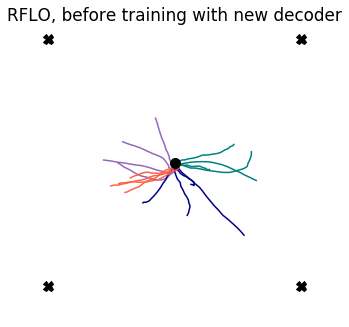

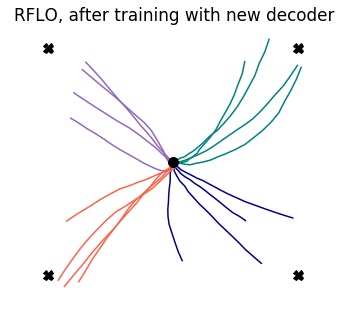

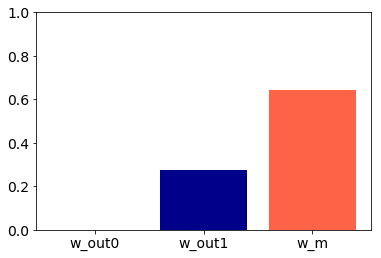

9it [00:00, 80.09it/s]

M norm: 1.11	 M angle: 0.50, 11 iterations
w_out1 norm: 1.47	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.11	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.70	 w_out vs. w_m angle: 0.26

500it [00:04, 114.48it/s]
3000it [00:32, 82.38it/s]
500it [00:04, 117.86it/s]


AR early fit 0.931, late fit 0.976


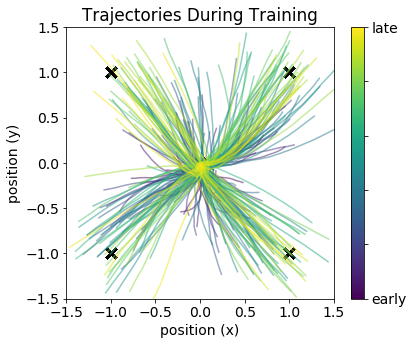

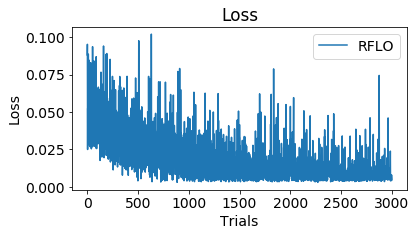

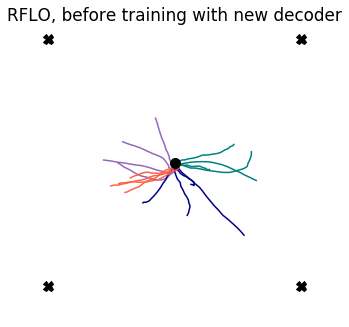

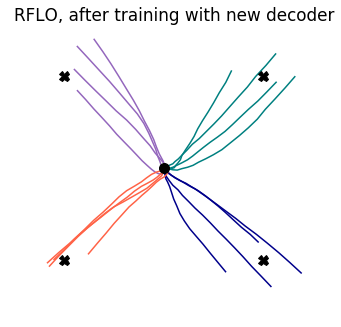

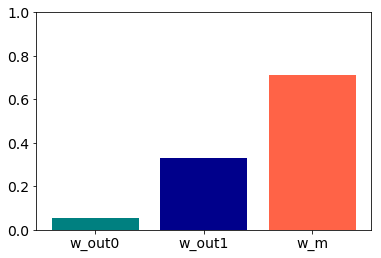

12it [00:00, 116.56it/s]

M norm: 1.00	 M angle: 0.60, 3 iterations
w_out1 norm: 1.47	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.00	 w_out1 vs. w_m angle: 0.60
w_m norm: 1.56	 w_out vs. w_m angle: 0.41

500it [00:04, 109.49it/s]
3000it [00:35, 84.80it/s]
500it [00:03, 126.04it/s]


AR early fit 0.931, late fit 0.972


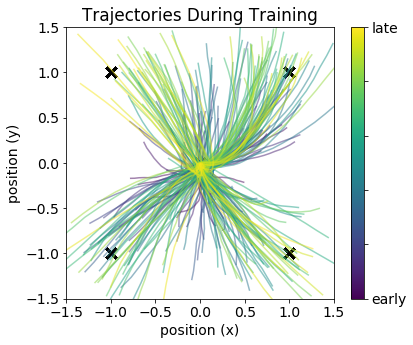

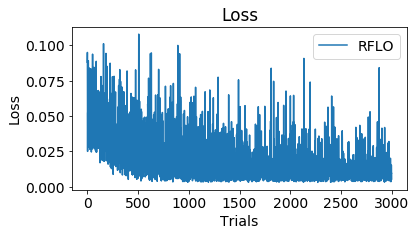

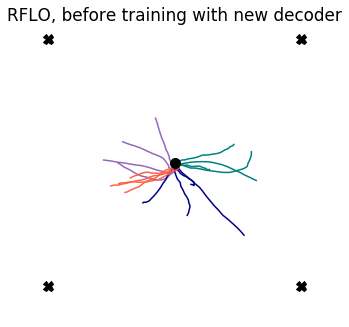

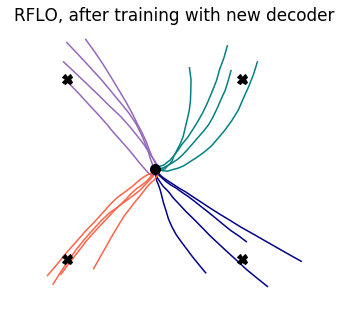

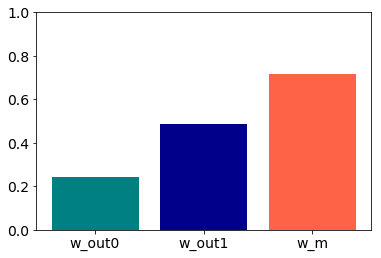

12it [00:00, 116.21it/s]

M norm: 0.89	 M angle: 0.71, 8 iterations
w_out1 norm: 1.47	 w_out vs. w_out1 angle: 0.51
w_m norm: 0.89	 w_out1 vs. w_m angle: 0.71
w_m norm: 1.52	 w_out vs. w_m angle: 0.46

500it [00:03, 125.31it/s]
3000it [00:36, 81.69it/s]
500it [00:04, 120.51it/s]


AR early fit 0.931, late fit 0.975


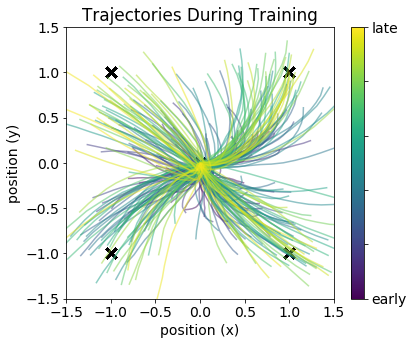

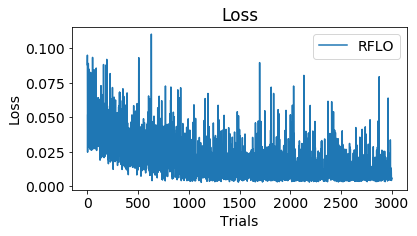

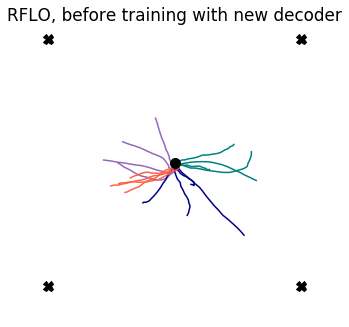

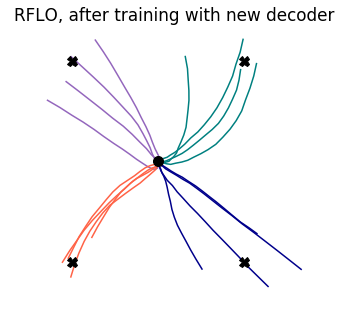

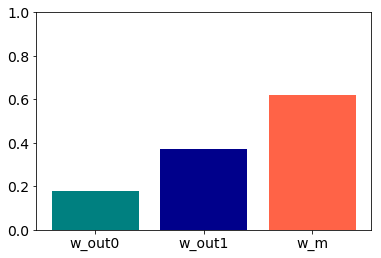

13it [00:00, 125.90it/s]

M norm: 0.72	 M angle: 0.80, 5 iterations
w_out1 norm: 1.47	 w_out vs. w_out1 angle: 0.51
w_m norm: 0.72	 w_out1 vs. w_m angle: 0.80
w_m norm: 1.55	 w_out vs. w_m angle: 0.42

500it [00:04, 121.69it/s]
3000it [00:33, 89.41it/s]
500it [00:04, 103.62it/s]


AR early fit 0.931, late fit 0.969


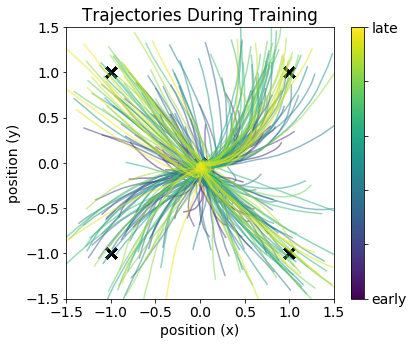

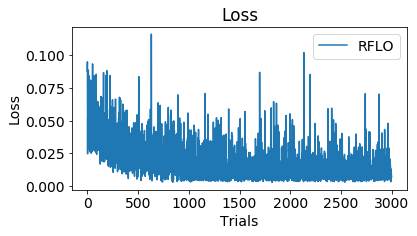

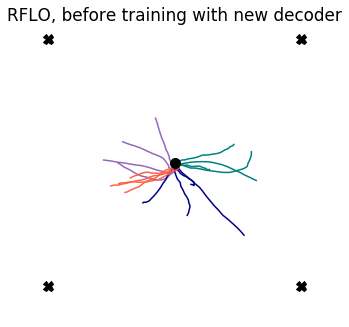

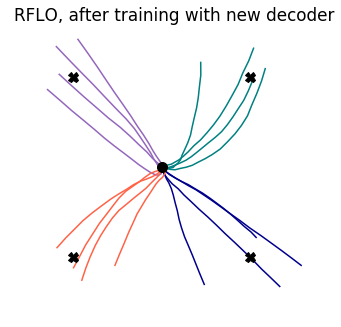

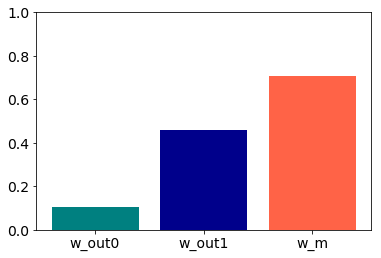

11it [00:00, 106.73it/s]

M norm: 0.53	 M angle: 0.90, 35 iterations
w_out1 norm: 1.47	 w_out vs. w_out1 angle: 0.51
w_m norm: 0.53	 w_out1 vs. w_m angle: 0.90
w_m norm: 1.54	 w_out vs. w_m angle: 0.45

500it [00:04, 112.71it/s]
3000it [00:32, 92.98it/s]
500it [00:04, 101.23it/s]


AR early fit 0.931, late fit 0.963


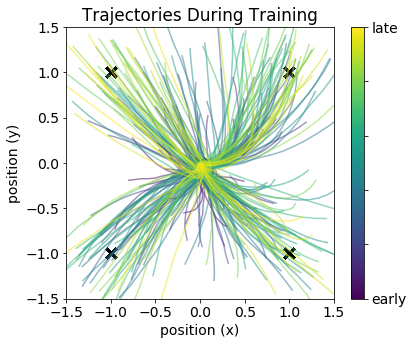

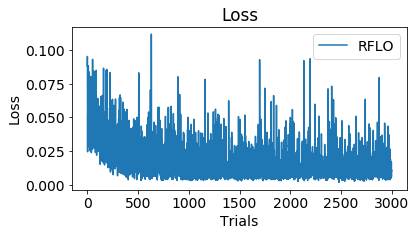

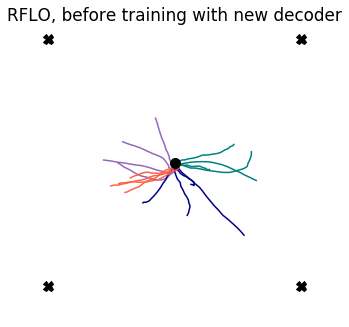

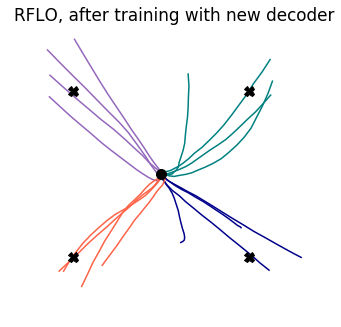

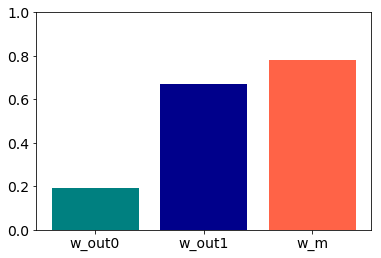

13it [00:00, 125.69it/s]

M norm: 0.00	 M angle: 1.00, 0 iterations
w_out1 norm: 1.47	 w_out vs. w_out1 angle: 0.51
w_m norm: 0.00	 w_out1 vs. w_m angle: 1.00
w_m norm: 1.47	 w_out vs. w_m angle: 0.51

500it [00:03, 126.15it/s]
3000it [00:33, 90.15it/s]
500it [00:04, 113.48it/s]


AR early fit 0.931, late fit 0.960


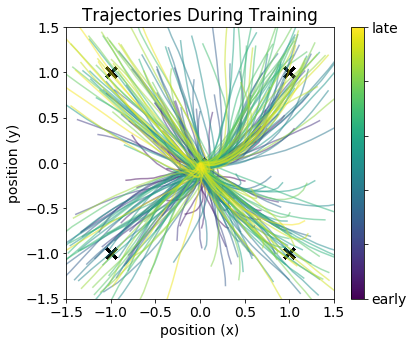

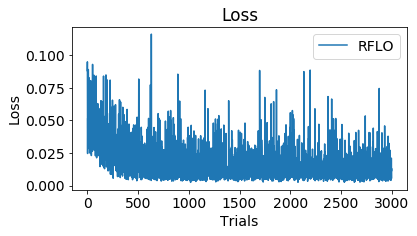

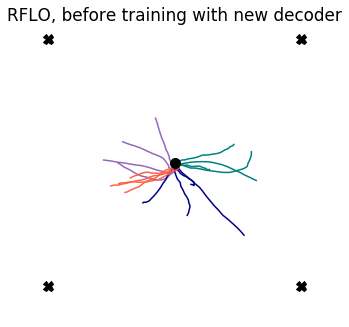

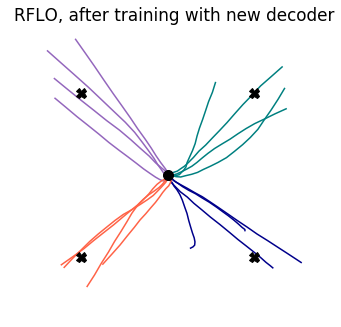

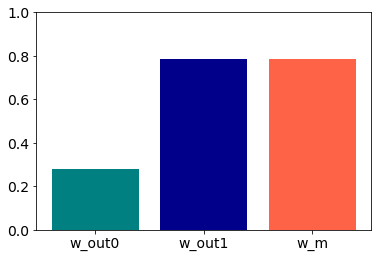

In [5]:
rnn_seed = 72
pretrain_duration = 2500
train_duration = 3000
test_duration = 500


# Set RNN Parameters
params = RNNparams(n_in=4,n_rec=50,n_out=2,tau_rec=10,
               eta_in=0.1,eta_rec=0.1,eta_out=0.1,
               sig_in=0.0,sig_rec=0.25,sig_out=0.01,
               velocity_transform=True, tau_vel = 0.8, dt_vel = 0.1,
               rng=np.random.RandomState(rnn_seed))
params.print_params()



# Initialize RNN
net0 = RNN(params)
sim0 = Simulation(net0)
rflo = RFLO(net0,apply_to=['w_rec'],online=False,error_fn='velocity')
sim0.run_session(n_trials=pretrain_duration, tasks=[task1,task2,task3,task4], learn_alg=[rflo], probe_types=['loss'], plot=True, plot_freq=20)

fig0 = plot_trained_trajectories(sim=sim0, tasks=[task1,task2,task3,task4],title='Pretrain RFLO, train '+r'$W_{rec}$')






""" Average over multiple seeds """
seeds = [0,22,33,47]
overlaps = [0.4,0.5,0.6,0.7,0.8,0.9,1]
n_changes = [60,50,50,50,30,30,0]
overlap_w_out0 = 0.5
n_change_w_out0 = 50


stats = {}
stats['corr1'] = []
stats['corr2'] = []
stats['corr3'] = []
stats['corrcoef'] = []

stats['seeds'] = seeds
stats['overlaps'] = overlaps
stats['n_changes'] = n_changes
stats['overlap_w_out0'] = overlap_w_out0
stats['n_change_w_out0'] = n_change_w_out0
stats['frac_on'] = frac_on
stats['RNNparams'] = params
stats['pretrain_duration'] = pretrain_duration
stats['train_duration'] = train_duration
stats['test_duration'] = test_duration
stats['rnn_seed'] = rnn_seed
stats['comments'] = 'vary overlap between M and w_out1'

for seed in seeds:

    corr1_list = []
    corr2_list = []
    corr3_list = []
    corrcoef_list = []
    

    for overlap,n_change in zip(overlaps,n_changes):
        
        """ let overlap between w_out0 and w_out1 be constant """
        w_out1 = choose_aligned_matrix(net0.w_out.copy(),n_change=n_change_w_out0,overlap=overlap_w_out0,rng=np.random.RandomState(seed),zero=False,tolerance=0.01,loop=1000)
        """ change overlap between w_out1 and w_m  """
        w_m = choose_aligned_matrix(w_out1,n_change=n_change,overlap=overlap,rng=np.random.RandomState(seed),zero=False,tolerance=0.01,loop=1000)

        # confirm overlap between w_out1 and w_out
        norm, angle = return_norm_and_angle(net0.w_out,w_out1)
        print('\nw_out1 norm: {:.2f}'.format(norm) + '\t w_out vs. w_out1 angle: {:.2f}'.format(angle),end='')

        # confirm overlap between w_out1 and w_m
        norm, angle = return_norm_and_angle(w_out1,w_m)
        print('\nw_m norm: {:.2f}'.format(norm) + '\t w_out1 vs. w_m angle: {:.2f}'.format(angle),end='')

        # confirm overlap between w_out and w_m
        norm, angle = return_norm_and_angle(net0.w_out,w_m)
        print('\nw_m norm: {:.2f}'.format(norm) + '\t w_out vs. w_m angle: {:.2f}'.format(angle),end='')
        
        
        
        
        net1_pre = RNN(params)
        net1_pre.set_weights(w_in=net0.w_in.copy(), w_rec=net0.w_rec.copy())
        net1_pre.set_weights(w_out = w_out1)
        net1_pre.set_weights(w_m = w_m.T)

        # unfortunately I need to make a different network to maintain integrity of pre and post simulations for plotting
        net1 = RNN(params)
        net1.set_weights(w_in=net0.w_in.copy(), w_rec=net0.w_rec.copy())
        net1.set_weights(w_out = w_out1)
        net1.set_weights(w_m = w_m.T)




        """ Track activity with new decoder, before training """

        sim1_pre = Simulation(net1_pre)
        trackvars = TrackVars(net1_pre,apply_to=[]) 
        sim1_pre.run_session(n_trials=test_duration, tasks=[task1,task2,task3,task4], learn_alg=[trackvars], probe_types=['h','err'], plot=False, plot_freq=10)
        #fig = plot_trained_trajectories(sim=sim1_pre, tasks=[task1,task2,task3,task4],title='RFLO, before training with new decoder')

        """ Train with new decoder """

        sim1_train = Simulation(net1)
        rflo = RFLO(net1,apply_to=['w_rec'],online=False)
        sim1_train.run_session(n_trials=train_duration, tasks=[task1,task2,task3,task4], learn_alg=[rflo], probe_types=['h','loss','err'], plot=True, plot_freq=10)

        """ Track activity with new decoder, after training """
        net1_post = RNN(params)
        net1_post.set_weights(w_in=net1.w_in.copy(), w_rec=net1.w_rec.copy())
        net1_post.set_weights(w_out = net1.w_out)
        net1_post.set_weights(w_m = net1.w_m)

        sim1_post = Simulation(net1_post)
        trackvars = TrackVars(net1_post,apply_to=[]) 
        sim1_post.run_session(n_trials=test_duration, tasks=[task1,task2,task3,task4], learn_alg=[trackvars], probe_types=['h','err'], plot=False, plot_freq=10)

        
        fig = plot_trained_trajectories(sim=sim1_pre, tasks=[task1,task2,task3,task4],title='RFLO, before training with new decoder')

        fig = plot_trained_trajectories(sim=sim1_post, tasks=[task1,task2,task3,task4],title='RFLO, after training with new decoder')
        
        
        """ Calculate F fields """
        F_early, score_early = flow_field_data(sim1_pre.session_probes['h'])
        F_late, score_late = flow_field_data(sim1_post.session_probes['h'])

        print('AR early fit {:.3f}, late fit {:.3f}'.format(score_early,score_late))

        Fdata = F_late - F_early

        # separate train and test data from sim1_train
        n_total = len(sim1_train.session_probes['h'])
        n_train = int(0.5 * n_total)
        idx_train = np.random.RandomState(1975+seed).choice(np.arange(0,n_total),size=n_train,replace=False).astype(int)
        idx_test = np.arange(0,n_total)[~idx_train].astype(int)
        #idx_test=idx_train

        h_train = np.asarray(sim1_train.session_probes['h'])[idx_train,:,:,:]
        err_train = np.asarray(sim1_train.session_probes['err'])[idx_train,:,:,:]

        Fpred_w_out = flow_field_predicted(net0.w_out,err_train,h_train)
        Fpred_w_out1 = flow_field_predicted(w_out1,err_train,h_train)
        Fpred_w_m = flow_field_predicted(w_m,err_train,h_train)

        h_test = np.asarray(sim1_train.session_probes['h'])[idx_test,:,:,:]

        corr1 = calculate_flow_field_correlation(Fpred_w_out,Fdata,h_test) # could also sample sim_test
        corr1_list.append(corr1)

        corr2 = calculate_flow_field_correlation(Fpred_w_out1,Fdata,h_test) # could also sample sim_test
        corr2_list.append(corr2)

        corr3 = calculate_flow_field_correlation(Fpred_w_m,Fdata,h_test) # could also sample sim_test
        corr3_list.append(corr3)
        
        fig,ax = plt.subplots(1,1)
        plt.bar([0,1,2],[corr1,corr2,corr3],tick_label=['w_out0','w_out1','w_m'],color=['teal','darkblue','tomato'])
        plt.ylim([0,1])
        plt.show()
        
        
        
        
        
        
    # update
    stats['corr1'].append(corr1_list)
    stats['corr2'].append(corr2_list)
    stats['corr3'].append(corr3_list)
    #stats['corrcoef'].append(corrcoef_list)



In [7]:
""" save dict with unique name """
stats_vel_m = stats

""" save dict """

save = False
tag = 'sup-vel-vel-5-25'


if save:
    
    with open(folder+'stats_vel_m-'+tag+'.pickle', 'wb') as handle:
        pickle.dump(stats_vel_m, handle, protocol=pickle.HIGHEST_PROTOCOL)
        
    print('\nsaved as '+folder+'stats_vel_m-'+tag+'.pickle')



saved as figs-2022-5-25/stats_vel_m-sup-vel-vel-5-25.pickle


In [9]:
""" Load RFLO version for same hyperparameters """

filename='../NeurIPS-2022-5-16/figs-2022-5-18/stats_rflo_m-fig2b-5-18.pickle'

with open(filename, 'rb') as fp:
    stats_rflo_m = pickle.load(fp)

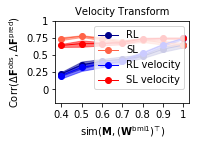

In [15]:
""" Same plot using flow field """
paper = True
save = True

fig,ax = plt.subplots(1,1,figsize=(6,4))

""" Baseline Result from Main Figure """
n_samples = len(stats_rflo_m['corr1'])
mn1 = np.mean(np.asarray(stats_rflo_m['corr1']),axis=0)
std1 = np.std(np.asarray(stats_rflo_m['corr1']),axis=0)
sem1 = std1/np.sqrt(n_samples)

mn2 = np.mean(np.asarray(stats_rflo_m['corr2']),axis=0)
std2 = np.std(np.asarray(stats_rflo_m['corr2']),axis=0)
sem2 = std2/np.sqrt(n_samples)

mn3 = np.mean(np.asarray(stats_rflo_m['corr3']),axis=0)
std3 = np.std(np.asarray(stats_rflo_m['corr3']),axis=0)
sem3 = std3/np.sqrt(n_samples)

""" velocity transform """
n_samples = len(stats_vel_m['corr1'])
mn4 = np.mean(np.asarray(stats_vel_m['corr2']),axis=0)
std4 = np.std(np.asarray(stats_vel_m['corr2']),axis=0)
sem4 = std4/np.sqrt(n_samples)

mn5 = np.mean(np.asarray(stats_vel_m['corr3']),axis=0)
std5 = np.std(np.asarray(stats_vel_m['corr3']),axis=0)
sem5 = std5/np.sqrt(n_samples)


# plt.plot(overlaps,mn1,'o-',linewidth=1,label=r'$W^{bmi0}$',color='teal')
# plt.fill_between(overlaps,mn1-sem1,mn1+sem1,alpha=0.5,color='teal')


plt.plot(overlaps,mn2,'o-',linewidth=1,label='RL',color='darkblue')
plt.fill_between(overlaps,mn2-sem2,mn2+sem2,alpha=0.5,color='darkblue')

plt.plot(overlaps,mn3,'o-',linewidth=1,label='SL',color='tomato')
plt.fill_between(overlaps,mn3-sem3,mn3+sem3,alpha=0.5,color='tomato')

plt.plot(overlaps,mn4,'o-',linewidth=1,label='RL velocity',color='blue')
plt.fill_between(overlaps,mn4-sem4,mn4+sem4,alpha=0.5,color='blue')

plt.plot(overlaps,mn5,'o-',linewidth=1,label='SL velocity',color='red')
plt.fill_between(overlaps,mn5-sem5,mn5+sem5,alpha=0.5,color='red')


plt.ylim([-0.2,1])
plt.legend()
plt.title('Velocity Transform')
plt.xlabel('sim('+r'$\mathbf{M},(\mathbf{W}^{\mathrm{bmi1}})^\top)$')
plt.ylabel('Corr'+r'$(\Delta \mathbf{F}^{\mathrm{obs}}, \Delta \mathbf{F}^{\mathrm{pred}})$')

plt.tight_layout()

if paper:
    fig,ax = paper_format(fig=fig,ax=ax,xlabels=[0.4,0.5,0.6,0.7,0.8,0.9,1],ylabels=[0,0.25,0.5,0.75,1],ticksize=10,linewidth=2,ylim=[-.2,1],figsize=(2.25,3))

plt.show()

if save:
    if paper:
        fig.savefig(folder+'sup-vel-change-m.pdf')
    else:
        fig.savefig(folder+'sup-vel-change-m_large.pdf')


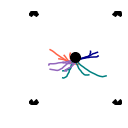

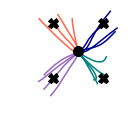

In [23]:
""" Example traces """

paper = True
save = False

fig0 = plot_trained_trajectories(sim=sim1_pre, tasks=[task1,task2,task3,task4],title='')

fig1 = plot_trained_trajectories(sim=sim1_post, tasks=[task1,task2,task3,task4],title='')

if paper:
    fig0,_ = paper_format(fig=fig0,ax=fig0.gca(),xlabels=None,ylabels=None,ticksize=10,linewidth=2,ylim=[-1,1],figsize=(2,2))
    fig1,_ = paper_format(fig=fig1,ax=fig0.gca(),xlabels=None,ylabels=None,ticksize=10,linewidth=2,ylim=[-1,1],figsize=(2,2))

if save:
    
    fig1.savefig(folder+'sup-vel-example.pdf')

# REINFORCE with velocity transform

In [5]:
trial_duration = 20
n_in=4
frac_on = 0.2

x_tonic = 0.0*np.ones((trial_duration, n_in)) # shape 20 x 4 i.e. time x channel
x_pulse1 = x_tonic.copy()
x_pulse2 = x_tonic.copy()
x_pulse3 = x_tonic.copy()
x_pulse4 = x_tonic.copy()
x_pulse1[0:int(trial_duration*frac_on),0] = 1
x_pulse2[0:int(trial_duration*frac_on),1] = 1
x_pulse3[0:int(trial_duration*frac_on),2] = 1
x_pulse4[0:int(trial_duration*frac_on),3] = 1

task1 = Task(x_in=x_pulse1,y_target=np.asarray([[1],[1]]))
task2 = Task(x_in=x_pulse2,y_target=np.asarray([[-1],[1]]))
task3 = Task(x_in=x_pulse3,y_target=np.asarray([[1],[-1]]))
task4 = Task(x_in=x_pulse4,y_target=np.asarray([[-1],[-1]]))

3it [00:00, 27.50it/s]

n_in: 4
n_rec: 50
n_out: 2
sig_in: 0.0
sig_rec: 0.25
sig_out: 0.01
tau_rec: 10
dt: 1.0
eta_in: 0.1
eta_rec: 0.1
eta_out: 0.1
g_in: 2.0
g_rec: 1.5
g_out: 2.0
g_fb: 2.0
driving_feedback: False
eta_fb: None
sig_fb: None
feedback_signal: position
velocity_transform: True
tau_vel: 0.8
dt_vel: 0.1
sig_rec_dim: None
eta_m: None
sig_m: None
lam_m: None
rng: <mtrand.RandomState object at 0x7faac5825ee8>


3000it [00:32, 91.52it/s]
11it [00:00, 104.06it/s]


~~~~ OVERLAP 0.2, SEED 0


M norm: 1.03	 M angle: 0.49, 20 iterations
w_out1 norm: 1.81	 w_out vs. w_out1 angle: 0.19
w_m norm: 1.03	 w_out1 vs. w_m angle: 0.49
w_m norm: 1.93	 w_out vs. w_m angle: 0.05

500it [00:04, 111.73it/s]
6000it [01:01, 96.98it/s] 
500it [00:04, 114.93it/s]


AR early fit 0.933, late fit 0.952


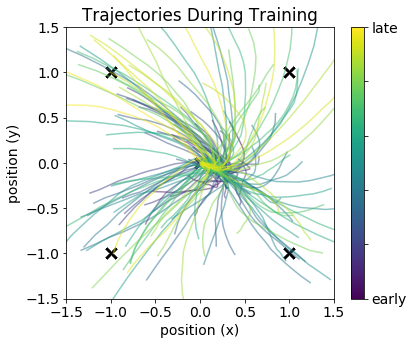

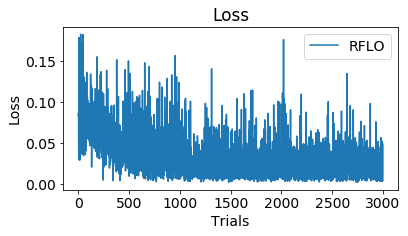

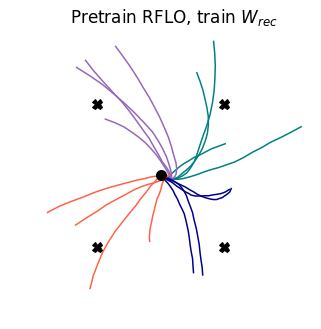

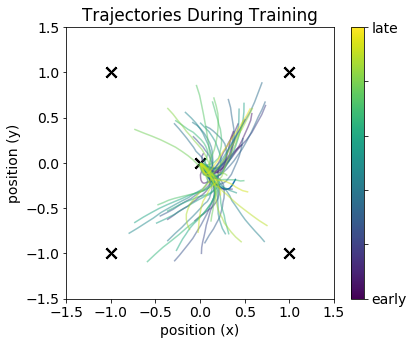

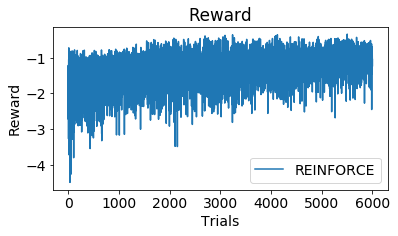

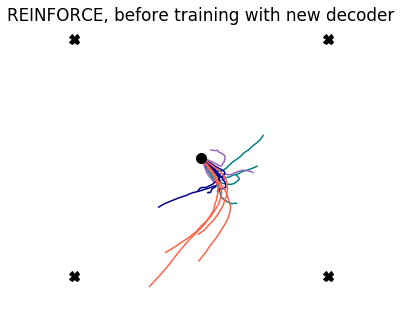

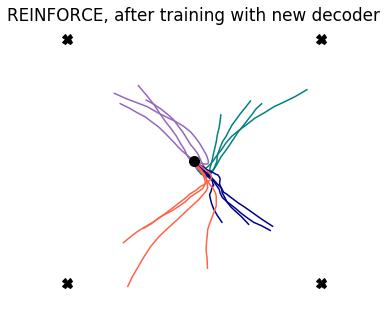

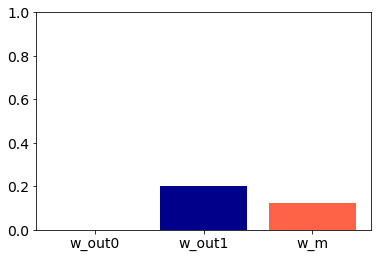

11it [00:00, 108.24it/s]


~~~~ OVERLAP 0.3, SEED 0


M norm: 0.96	 M angle: 0.51, 7 iterations
w_out1 norm: 1.67	 w_out vs. w_out1 angle: 0.30
w_m norm: 0.96	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.75	 w_out vs. w_m angle: 0.17

500it [00:04, 112.37it/s]
6000it [01:09, 86.94it/s] 
500it [00:04, 121.92it/s]


AR early fit 0.933, late fit 0.957


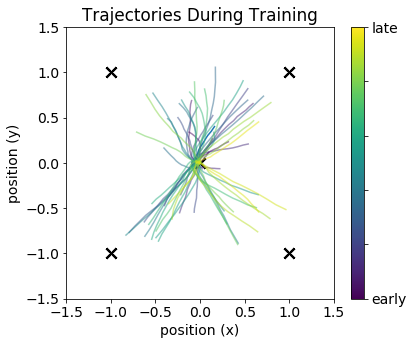

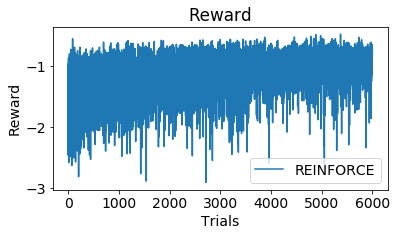

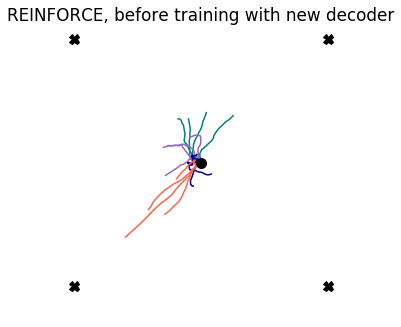

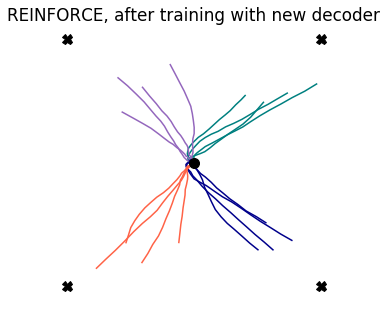

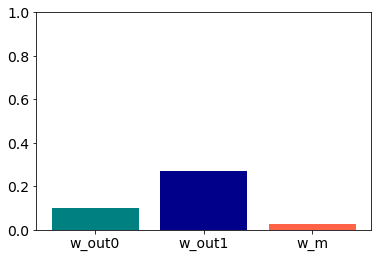

6it [00:00, 59.75it/s]


~~~~ OVERLAP 0.4, SEED 0


M norm: 1.13	 M angle: 0.50, 7 iterations
w_out1 norm: 1.60	 w_out vs. w_out1 angle: 0.41
w_m norm: 1.13	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.66	 w_out vs. w_m angle: 0.33

500it [00:04, 112.48it/s]
6000it [00:57, 104.69it/s]
500it [00:04, 123.26it/s]


AR early fit 0.933, late fit 0.956


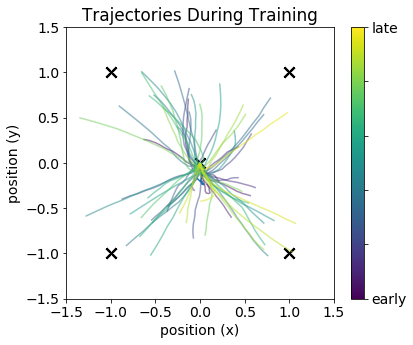

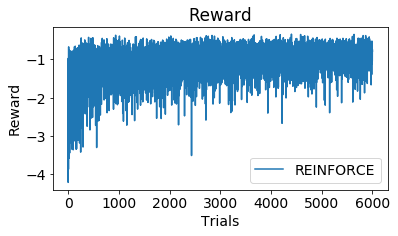

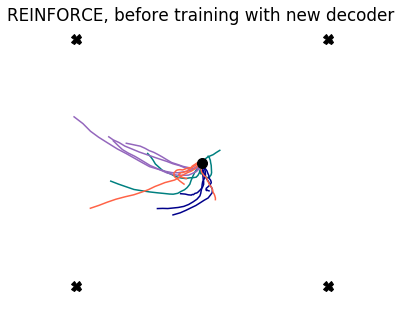

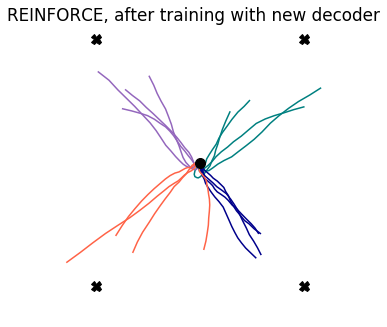

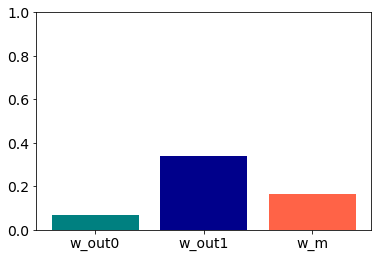

7it [00:00, 63.48it/s]


~~~~ OVERLAP 0.5, SEED 0


M norm: 1.21	 M angle: 0.49, 34 iterations
w_out1 norm: 1.52	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.21	 w_out1 vs. w_m angle: 0.49
w_m norm: 1.85	 w_out vs. w_m angle: 0.11

500it [00:04, 121.14it/s]
6000it [00:56, 105.79it/s]
500it [00:04, 123.61it/s]


AR early fit 0.933, late fit 0.953


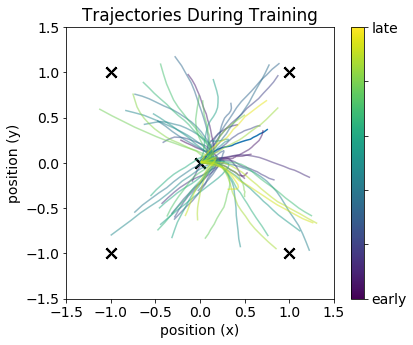

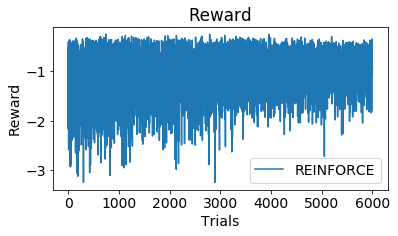

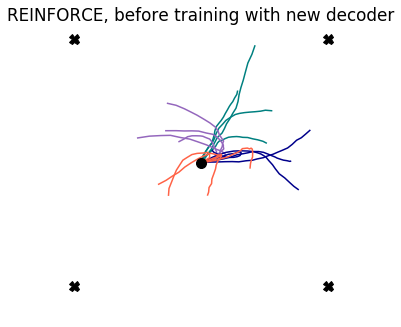

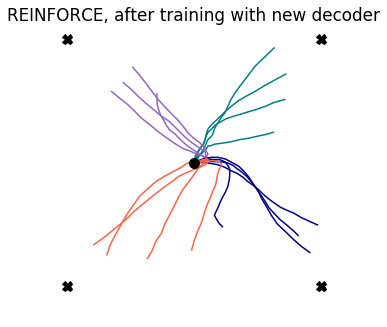

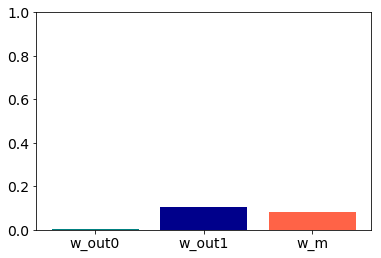

8it [00:00, 77.92it/s]


~~~~ OVERLAP 0.6, SEED 0


M norm: 1.18	 M angle: 0.49, 2 iterations
w_out1 norm: 1.37	 w_out vs. w_out1 angle: 0.60
w_m norm: 1.18	 w_out1 vs. w_m angle: 0.49
w_m norm: 1.73	 w_out vs. w_m angle: 0.24

500it [00:04, 122.32it/s]
6000it [00:57, 105.02it/s]
500it [00:04, 123.02it/s]


AR early fit 0.933, late fit 0.952


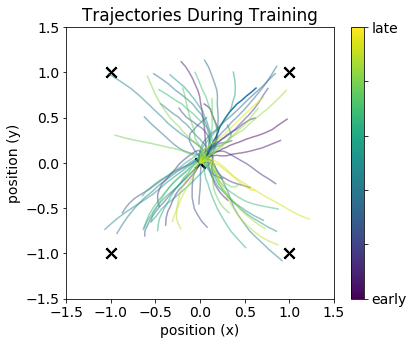

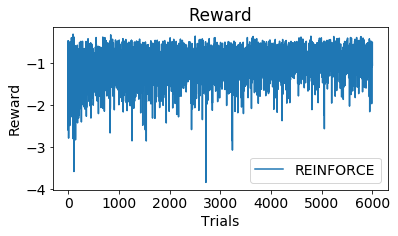

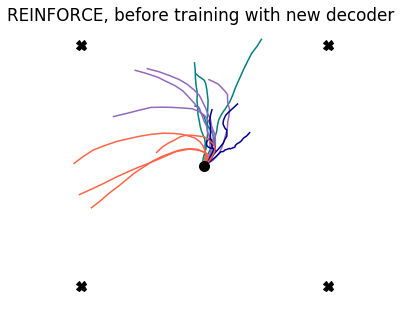

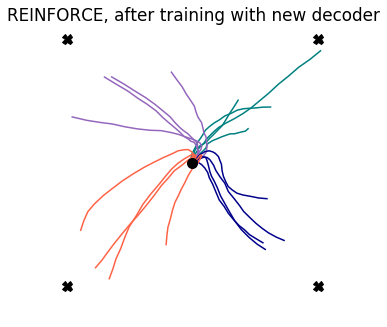

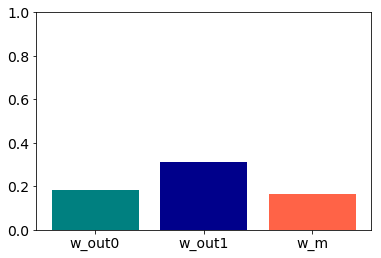

7it [00:00, 69.08it/s]


~~~~ OVERLAP 0.7, SEED 0


M norm: 1.20	 M angle: 0.50, 37 iterations
w_out1 norm: 1.20	 w_out vs. w_out1 angle: 0.70
w_m norm: 1.20	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.58	 w_out vs. w_m angle: 0.38

500it [00:04, 120.62it/s]
6000it [00:57, 104.76it/s]
500it [00:04, 122.89it/s]


AR early fit 0.933, late fit 0.949


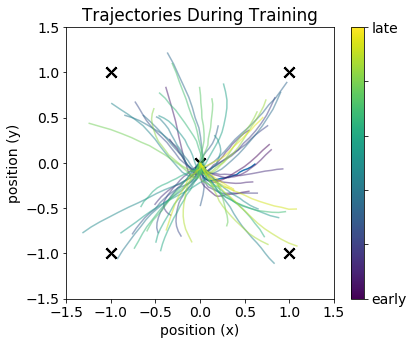

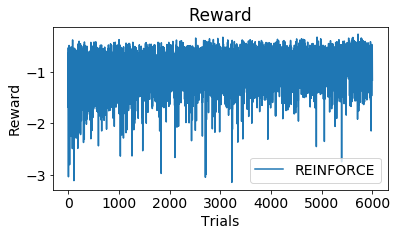

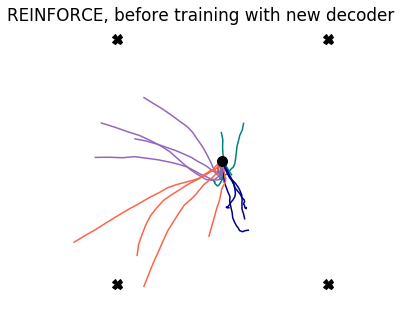

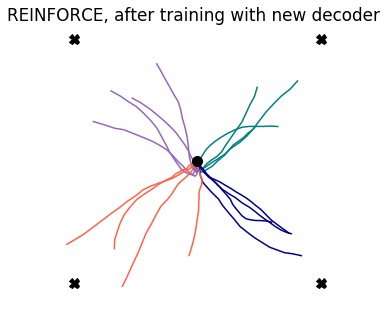

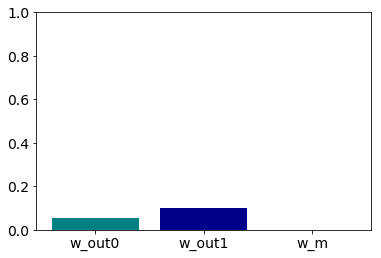

7it [00:00, 67.87it/s]


~~~~ OVERLAP 0.8, SEED 0


M norm: 1.38	 M angle: 0.49, 38 iterations
w_out1 norm: 1.00	 w_out vs. w_out1 angle: 0.81
w_m norm: 1.38	 w_out1 vs. w_m angle: 0.49
w_m norm: 1.71	 w_out vs. w_m angle: 0.31

500it [00:04, 119.10it/s]
6000it [00:56, 105.31it/s]
500it [00:04, 122.38it/s]


AR early fit 0.933, late fit 0.940


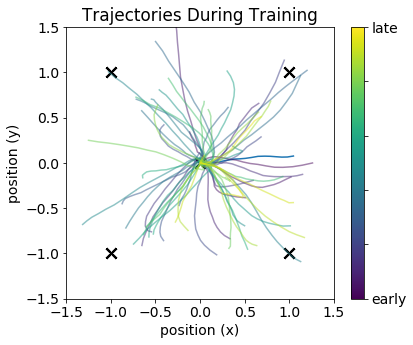

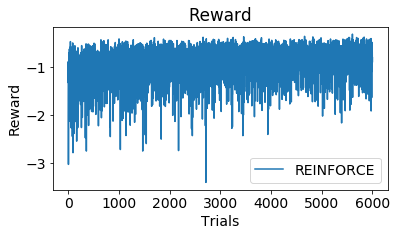

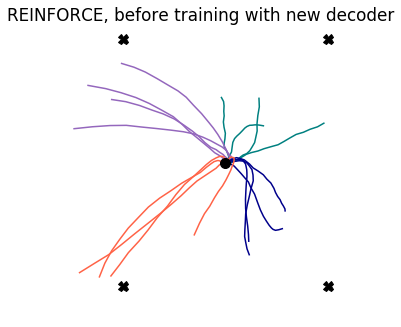

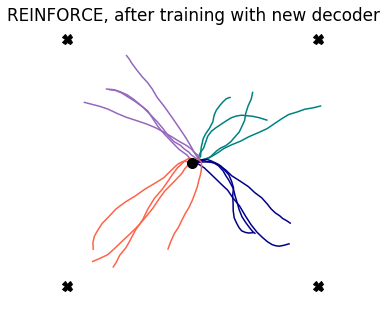

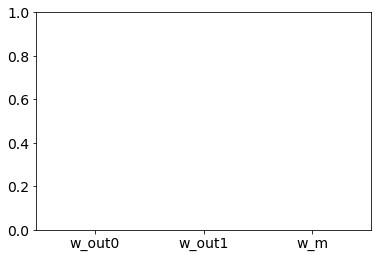

6it [00:00, 56.70it/s]


~~~~ OVERLAP 0.9, SEED 0


M norm: 1.41	 M angle: 0.51, 55 iterations
w_out1 norm: 0.76	 w_out vs. w_out1 angle: 0.89
w_m norm: 1.41	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.57	 w_out vs. w_m angle: 0.44

500it [00:04, 121.54it/s]
6000it [00:57, 105.01it/s]
500it [00:04, 122.59it/s]


AR early fit 0.933, late fit 0.940


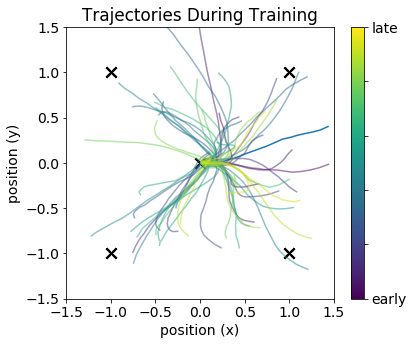

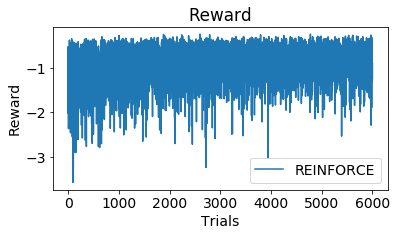

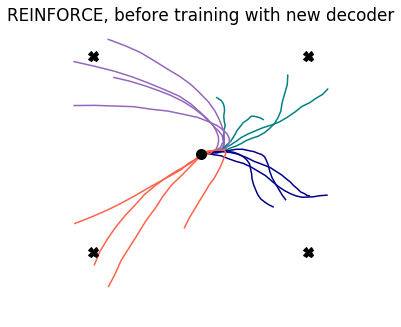

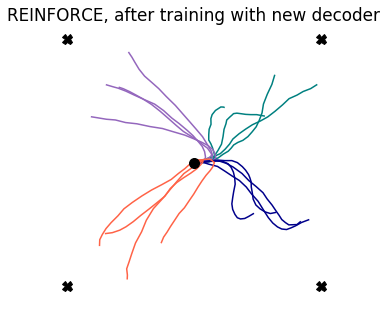

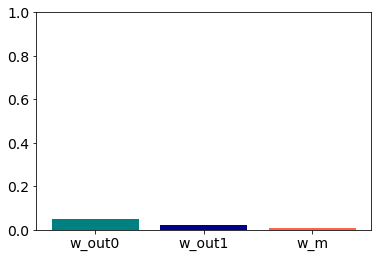

9it [00:00, 84.44it/s]


~~~~ OVERLAP 1, SEED 0


M norm: 1.52	 M angle: 0.51, 53 iterations
w_out1 norm: 0.00	 w_out vs. w_out1 angle: 1.00
w_m norm: 1.52	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.52	 w_out vs. w_m angle: 0.51

500it [00:04, 122.12it/s]
6000it [00:56, 106.04it/s]
500it [00:04, 124.03it/s]


AR early fit 0.933, late fit 0.937


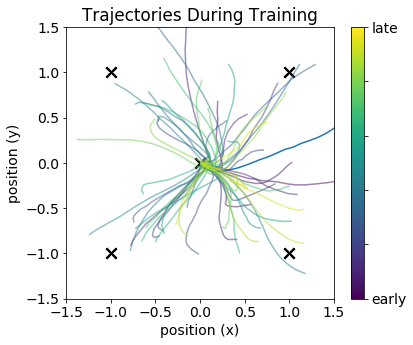

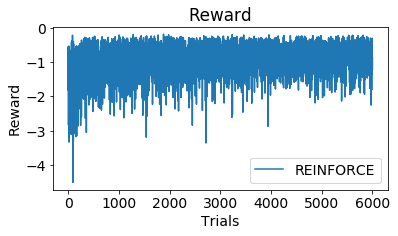

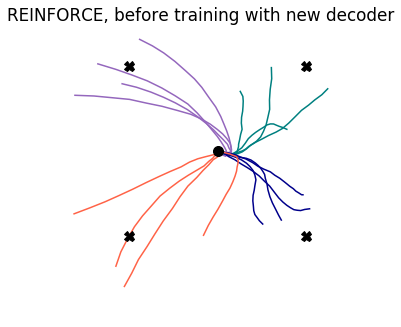

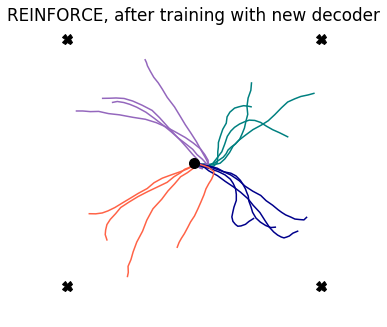

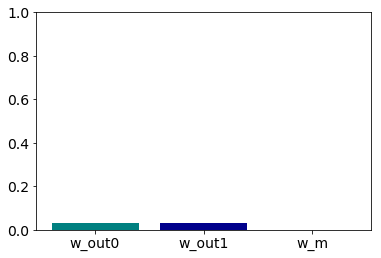

6it [00:00, 54.91it/s]


~~~~ OVERLAP 0.2, SEED 22


M norm: 1.00	 M angle: 0.49, 21 iterations
w_out1 norm: 1.78	 w_out vs. w_out1 angle: 0.21
w_m norm: 1.00	 w_out1 vs. w_m angle: 0.49
w_m norm: 1.91	 w_out vs. w_m angle: 0.02

500it [00:04, 121.42it/s]
6000it [00:57, 106.37it/s]
500it [00:04, 123.07it/s]


AR early fit 0.933, late fit 0.957


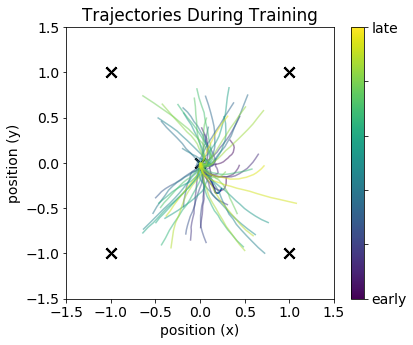

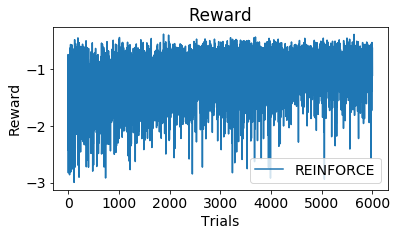

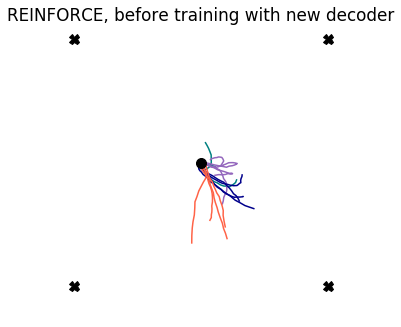

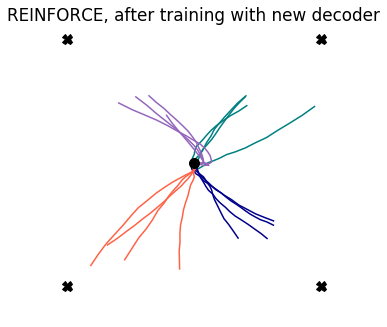

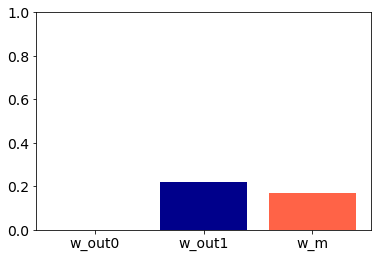

7it [00:00, 65.95it/s]


~~~~ OVERLAP 0.3, SEED 22


M norm: 1.03	 M angle: 0.50, 47 iterations
w_out1 norm: 1.69	 w_out vs. w_out1 angle: 0.30
w_m norm: 1.03	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.80	 w_out vs. w_m angle: 0.16

500it [00:04, 121.57it/s]
6000it [00:57, 104.16it/s]
500it [00:04, 122.71it/s]


AR early fit 0.933, late fit 0.956


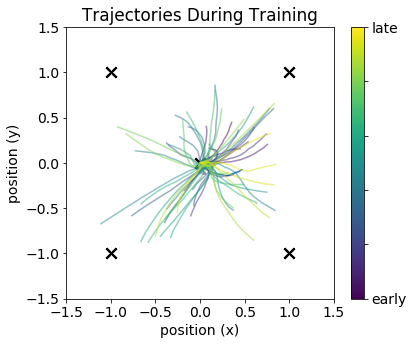

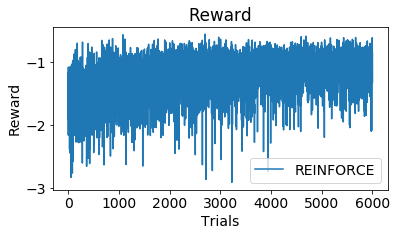

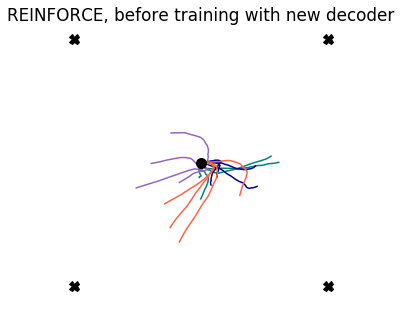

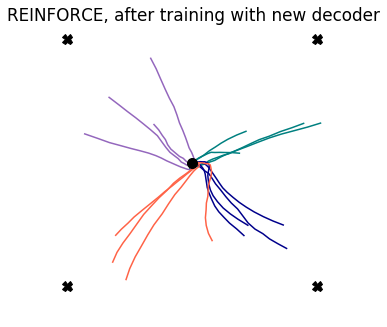

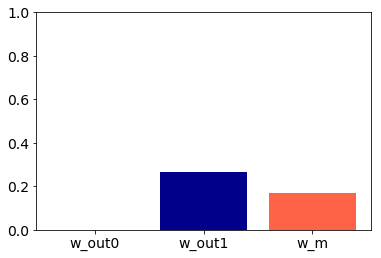

9it [00:00, 86.24it/s]


~~~~ OVERLAP 0.4, SEED 22


M norm: 1.07	 M angle: 0.50, 8 iterations
w_out1 norm: 1.60	 w_out vs. w_out1 angle: 0.40
w_m norm: 1.07	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.69	 w_out vs. w_m angle: 0.27

500it [00:04, 120.48it/s]
6000it [00:59, 103.42it/s]
500it [00:04, 121.16it/s]


AR early fit 0.933, late fit 0.951


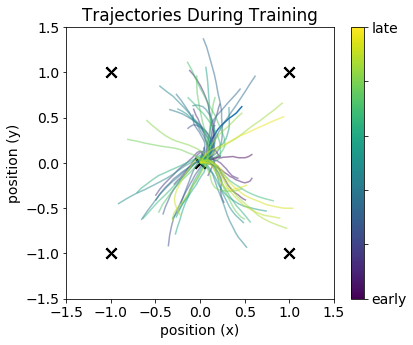

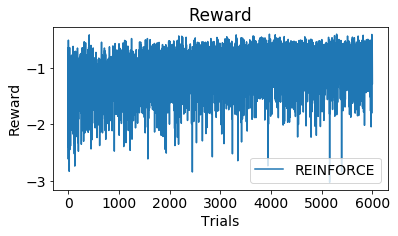

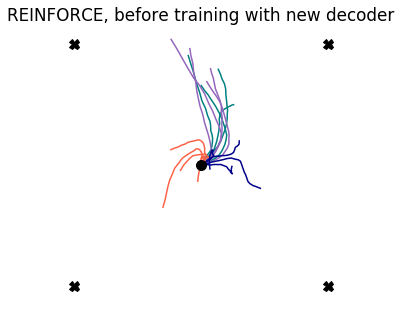

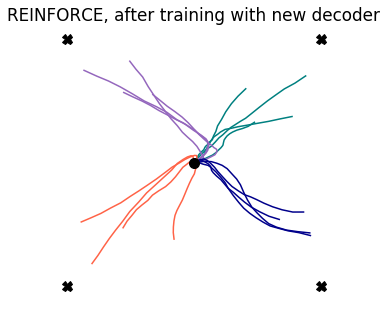

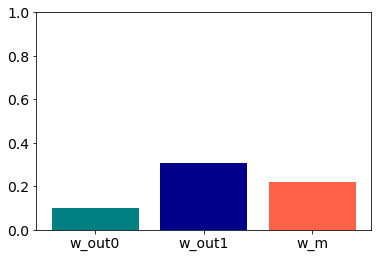

7it [00:00, 67.86it/s]


~~~~ OVERLAP 0.5, SEED 22


M norm: 1.10	 M angle: 0.51, 5 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.10	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.75	 w_out vs. w_m angle: 0.21

500it [00:04, 122.99it/s]
6000it [00:57, 104.73it/s]
500it [00:04, 123.93it/s]


AR early fit 0.933, late fit 0.957


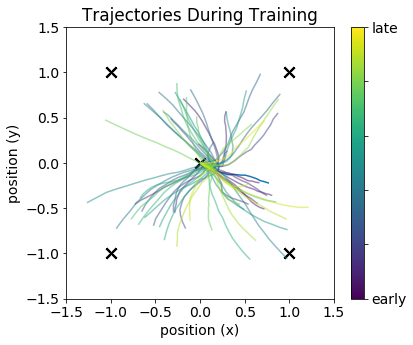

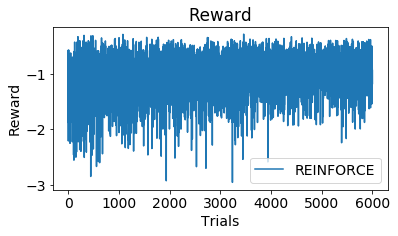

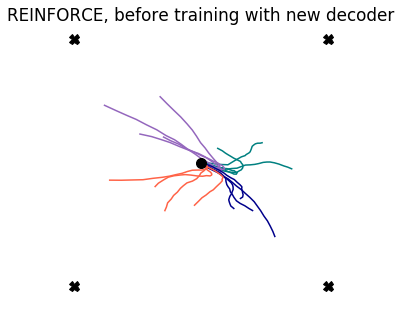

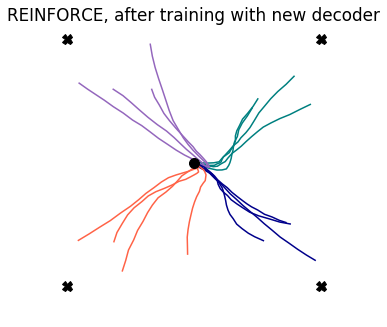

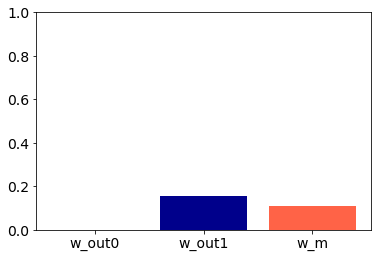

11it [00:00, 108.19it/s]


~~~~ OVERLAP 0.6, SEED 22


M norm: 1.16	 M angle: 0.49, 6 iterations
w_out1 norm: 1.34	 w_out vs. w_out1 angle: 0.61
w_m norm: 1.16	 w_out1 vs. w_m angle: 0.49
w_m norm: 1.68	 w_out vs. w_m angle: 0.29

500it [00:04, 123.45it/s]
6000it [00:57, 104.72it/s]
500it [00:04, 122.91it/s]


AR early fit 0.933, late fit 0.950


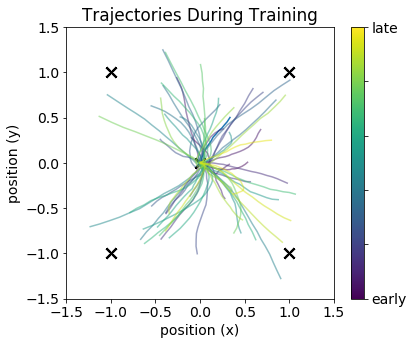

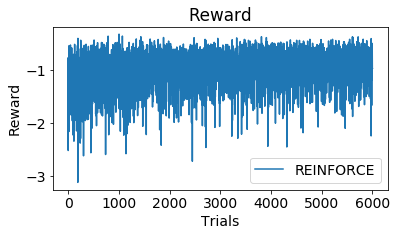

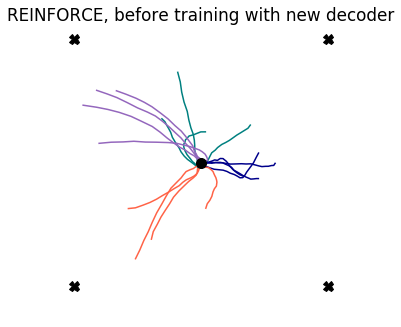

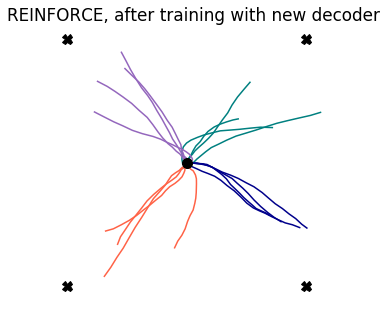

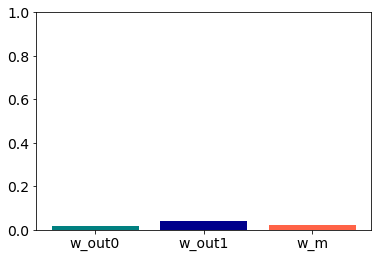

10it [00:00, 99.47it/s]


~~~~ OVERLAP 0.7, SEED 22


M norm: 1.16	 M angle: 0.50, 21 iterations
w_out1 norm: 1.21	 w_out vs. w_out1 angle: 0.69
w_m norm: 1.16	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.66	 w_out vs. w_m angle: 0.32

500it [00:04, 123.56it/s]
6000it [00:57, 104.31it/s]
500it [00:05, 97.91it/s] 


AR early fit 0.933, late fit 0.952


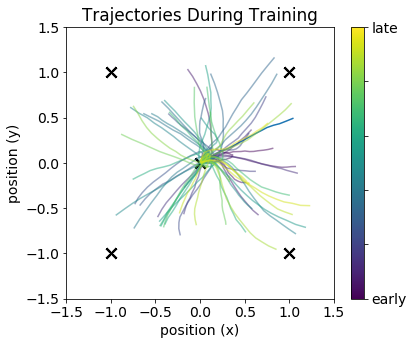

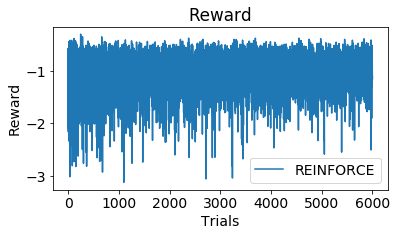

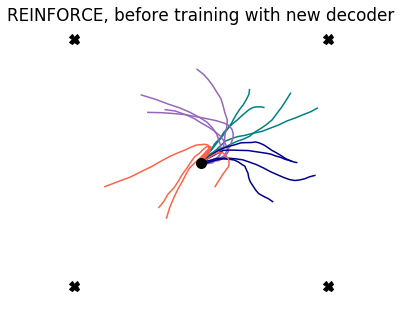

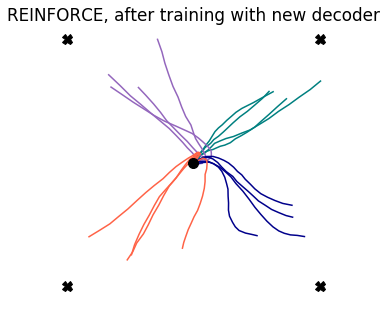

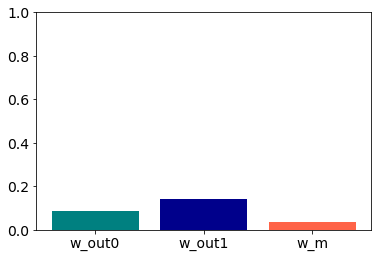

10it [00:00, 96.82it/s]


~~~~ OVERLAP 0.8, SEED 22


M norm: 1.29	 M angle: 0.50, 44 iterations
w_out1 norm: 1.03	 w_out vs. w_out1 angle: 0.79
w_m norm: 1.29	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.60	 w_out vs. w_m angle: 0.38

500it [00:04, 113.22it/s]
6000it [01:02, 78.91it/s]
500it [00:05, 109.24it/s]


AR early fit 0.933, late fit 0.938


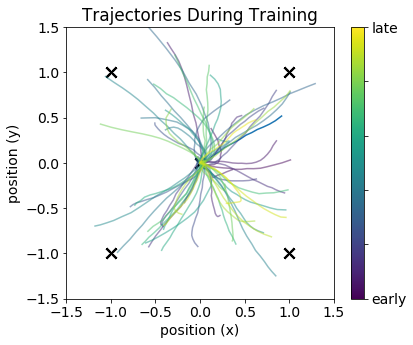

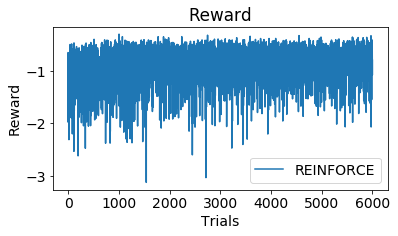

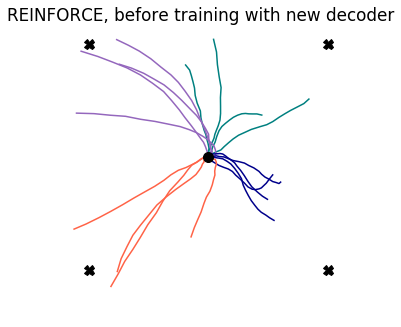

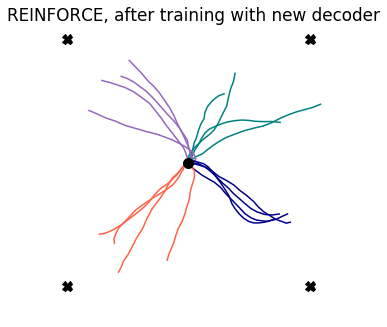

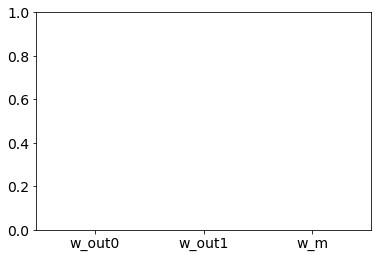

6it [00:00, 53.60it/s]


~~~~ OVERLAP 0.9, SEED 22


M norm: 1.37	 M angle: 0.51, 5 iterations
w_out1 norm: 0.73	 w_out vs. w_out1 angle: 0.90
w_m norm: 1.37	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.47	 w_out vs. w_m angle: 0.50

500it [00:05, 96.85it/s] 
6000it [01:04, 92.31it/s] 
500it [00:04, 119.39it/s]


AR early fit 0.933, late fit 0.938


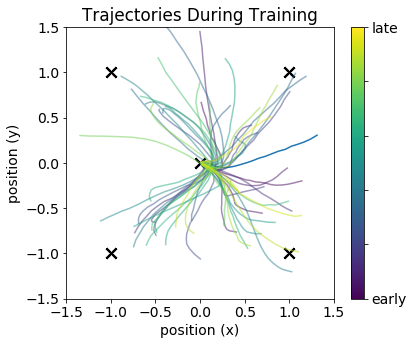

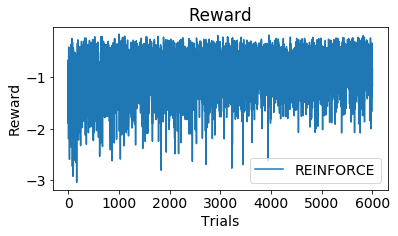

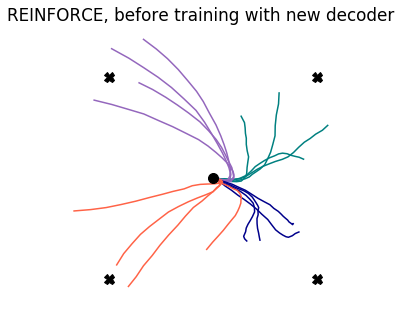

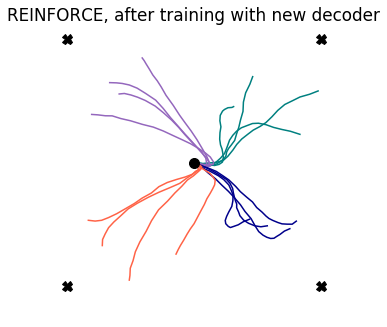

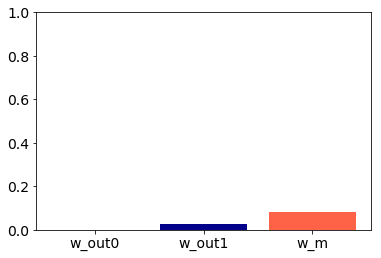

9it [00:00, 89.80it/s]


~~~~ OVERLAP 1, SEED 22


M norm: 1.52	 M angle: 0.51, 53 iterations
w_out1 norm: 0.00	 w_out vs. w_out1 angle: 1.00
w_m norm: 1.52	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.52	 w_out vs. w_m angle: 0.51

500it [00:04, 122.61it/s]
6000it [00:59, 101.65it/s]
500it [00:04, 123.94it/s]


AR early fit 0.933, late fit 0.937


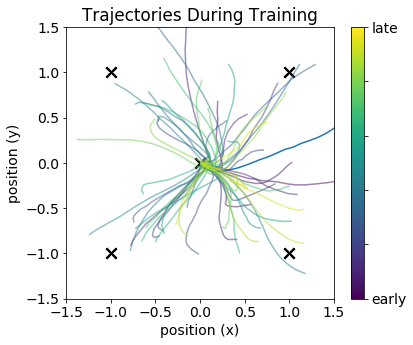

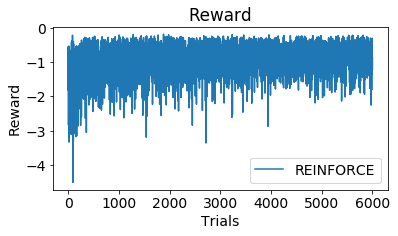

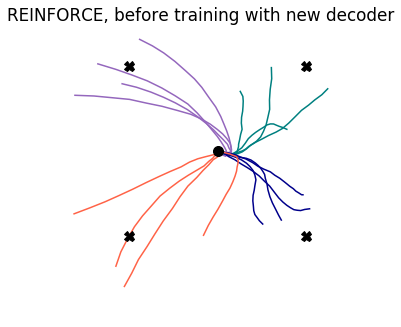

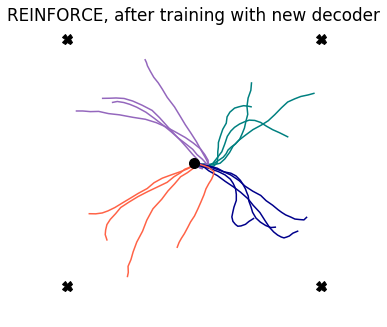

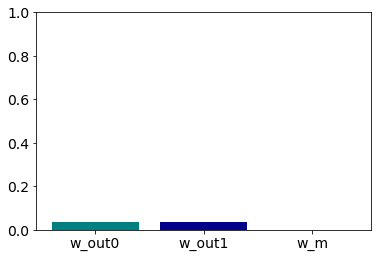

8it [00:00, 79.46it/s]


~~~~ OVERLAP 0.2, SEED 33


M norm: 0.88	 M angle: 0.50, 14 iterations
w_out1 norm: 1.75	 w_out vs. w_out1 angle: 0.19
w_m norm: 0.88	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.80	 w_out vs. w_m angle: 0.06

500it [00:04, 122.86it/s]
6000it [00:56, 106.76it/s]
500it [00:04, 123.78it/s]


AR early fit 0.933, late fit 0.961


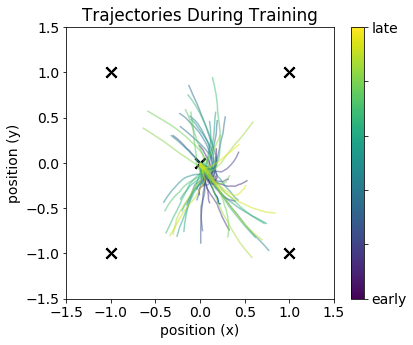

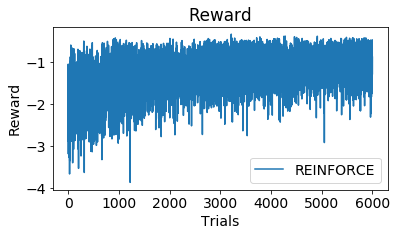

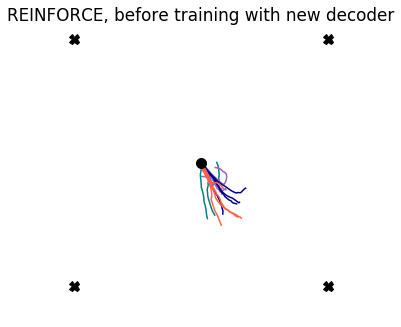

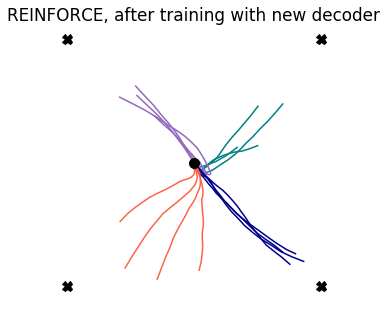

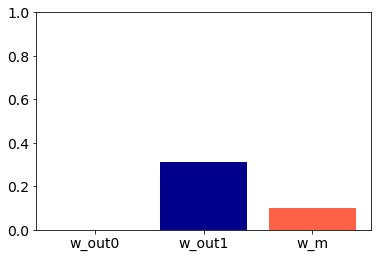

9it [00:00, 88.53it/s]


~~~~ OVERLAP 0.3, SEED 33


M norm: 1.06	 M angle: 0.49, 22 iterations
w_out1 norm: 1.71	 w_out vs. w_out1 angle: 0.29
w_m norm: 1.06	 w_out1 vs. w_m angle: 0.49
w_m norm: 1.74	 w_out vs. w_m angle: 0.22

500it [00:04, 125.07it/s]
6000it [00:56, 105.88it/s]
500it [00:04, 123.86it/s]


AR early fit 0.933, late fit 0.955


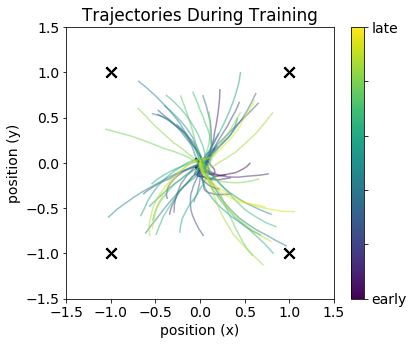

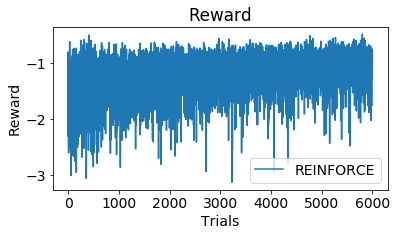

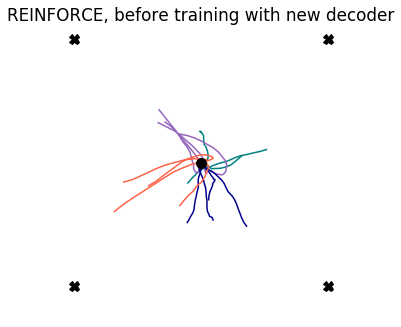

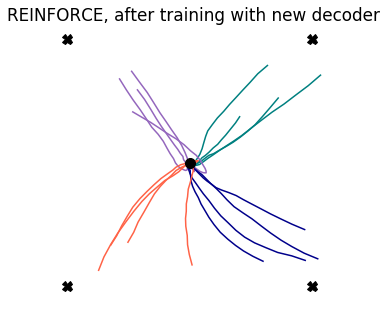

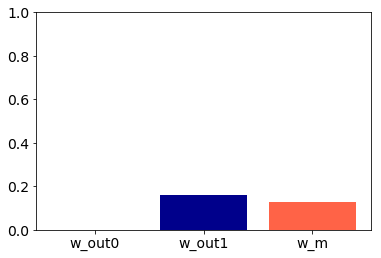

7it [00:00, 66.39it/s]


~~~~ OVERLAP 0.4, SEED 33


M norm: 1.09	 M angle: 0.50, 12 iterations
w_out1 norm: 1.61	 w_out vs. w_out1 angle: 0.41
w_m norm: 1.09	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.85	 w_out vs. w_m angle: 0.09

500it [00:04, 121.76it/s]
6000it [01:04, 93.34it/s]
500it [00:05, 92.63it/s]


AR early fit 0.933, late fit 0.955


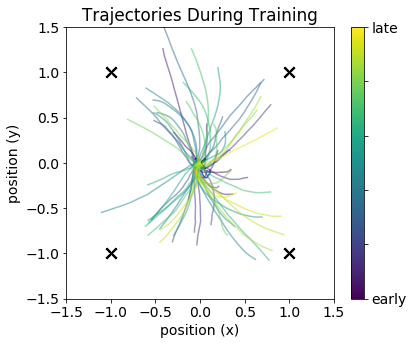

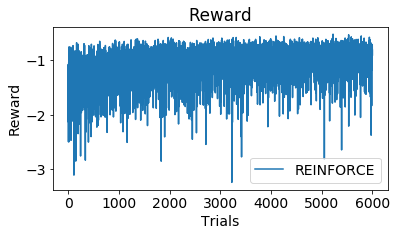

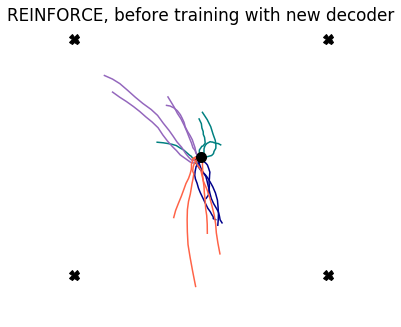

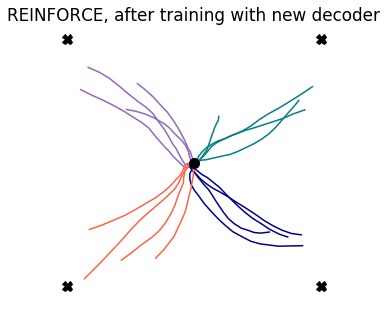

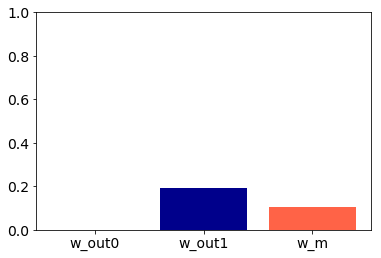

10it [00:00, 94.41it/s]


~~~~ OVERLAP 0.5, SEED 33


M norm: 1.15	 M angle: 0.50, 4 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.15	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.63	 w_out vs. w_m angle: 0.34

500it [00:05, 93.71it/s]
6000it [01:13, 82.14it/s]
500it [00:05, 97.60it/s] 


AR early fit 0.933, late fit 0.953


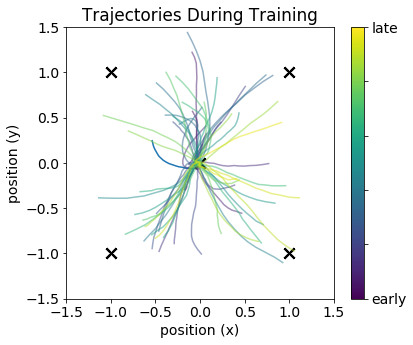

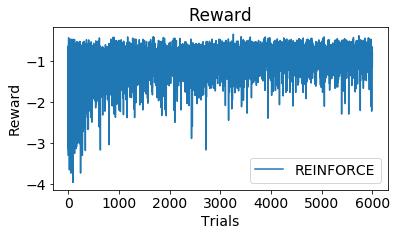

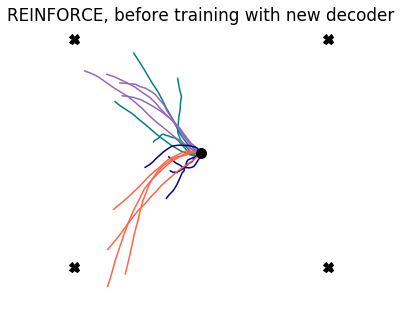

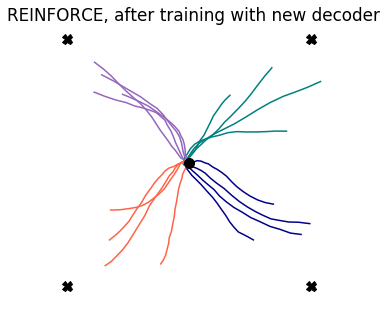

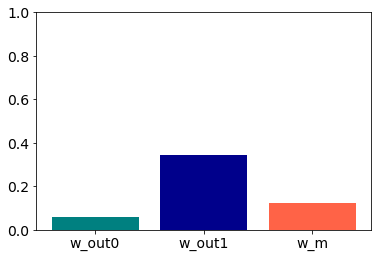

11it [00:00, 105.95it/s]


~~~~ OVERLAP 0.6, SEED 33


M norm: 1.16	 M angle: 0.51, 1 iterations
w_out1 norm: 1.36	 w_out vs. w_out1 angle: 0.60
w_m norm: 1.16	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.71	 w_out vs. w_m angle: 0.26

500it [00:05, 94.47it/s]
6000it [01:13, 81.50it/s]
500it [00:05, 98.60it/s] 


AR early fit 0.933, late fit 0.948


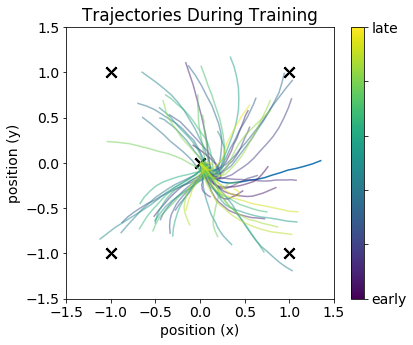

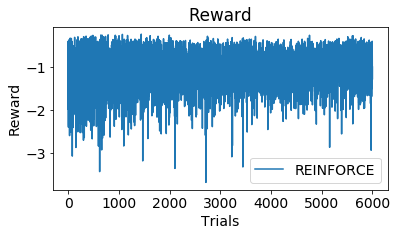

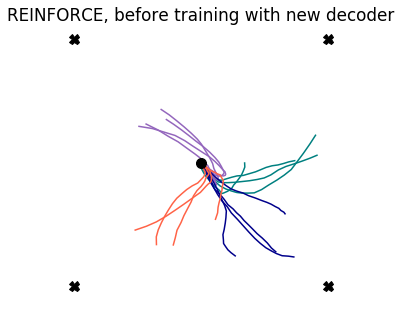

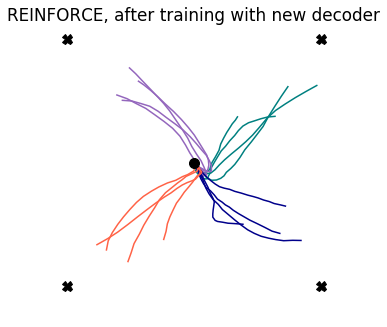

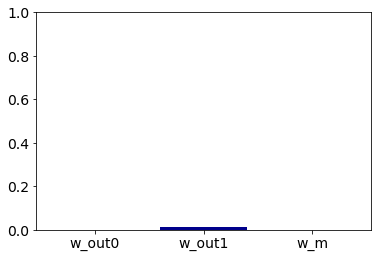

10it [00:00, 97.90it/s]


~~~~ OVERLAP 0.7, SEED 33


M norm: 1.27	 M angle: 0.50, 34 iterations
w_out1 norm: 1.20	 w_out vs. w_out1 angle: 0.70
w_m norm: 1.27	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.62	 w_out vs. w_m angle: 0.37

500it [00:05, 95.87it/s] 
6000it [01:12, 82.37it/s]
500it [00:05, 92.69it/s]


AR early fit 0.933, late fit 0.951


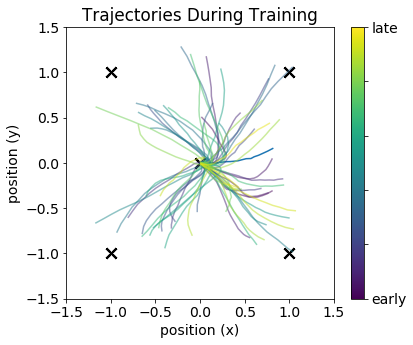

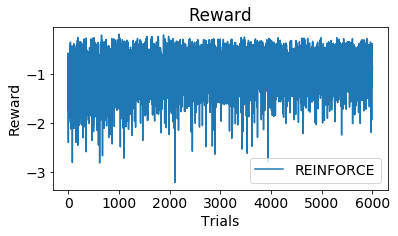

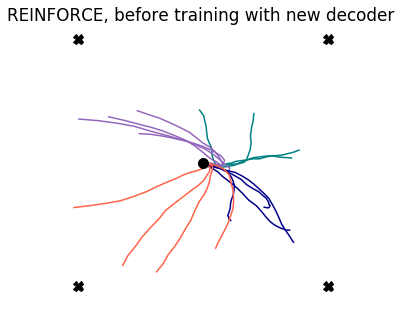

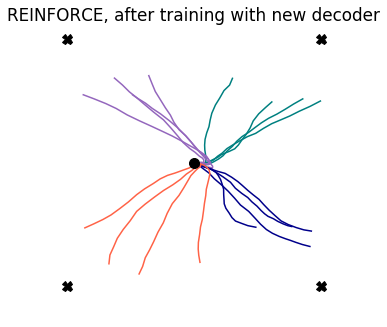

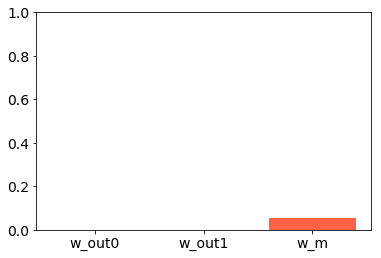

10it [00:00, 93.99it/s]


~~~~ OVERLAP 0.8, SEED 33


M norm: 1.28	 M angle: 0.49, 32 iterations
w_out1 norm: 0.99	 w_out vs. w_out1 angle: 0.81
w_m norm: 1.28	 w_out1 vs. w_m angle: 0.49
w_m norm: 1.60	 w_out vs. w_m angle: 0.37

500it [00:05, 89.91it/s]
6000it [01:13, 81.83it/s]
500it [00:05, 97.31it/s] 


AR early fit 0.933, late fit 0.942


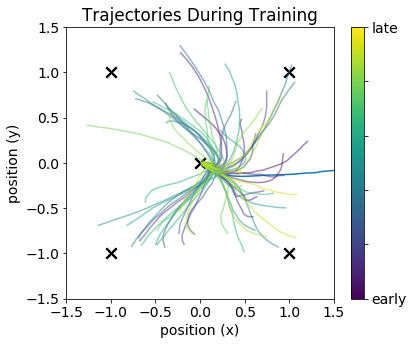

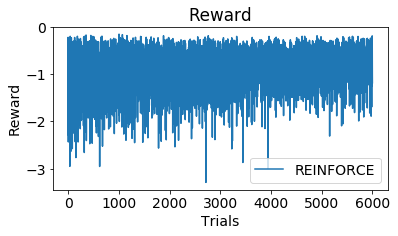

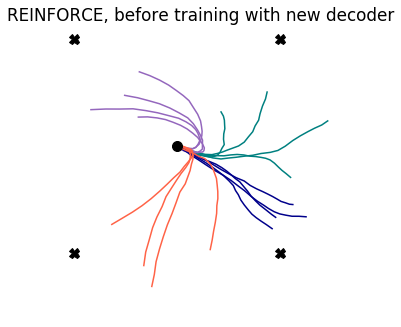

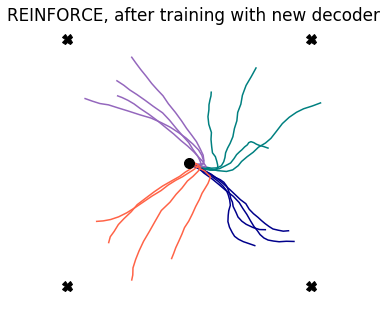

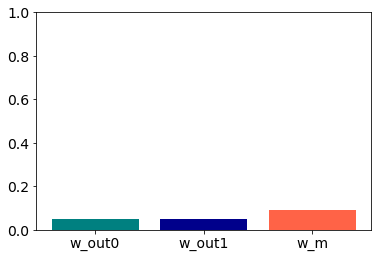

5it [00:00, 46.77it/s]


~~~~ OVERLAP 0.9, SEED 33


M norm: 1.34	 M angle: 0.51, 17 iterations
w_out1 norm: 0.74	 w_out vs. w_out1 angle: 0.90
w_m norm: 1.34	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.52	 w_out vs. w_m angle: 0.46

500it [00:05, 96.20it/s]
6000it [00:58, 102.30it/s]
500it [00:04, 123.66it/s]


AR early fit 0.933, late fit 0.936


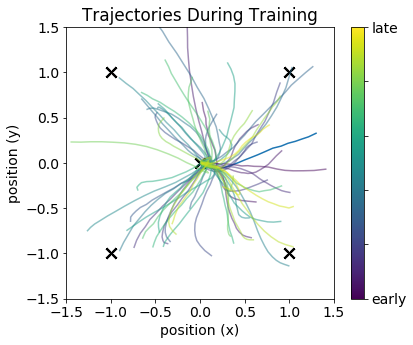

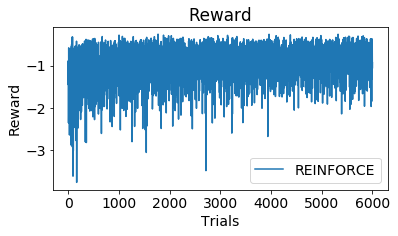

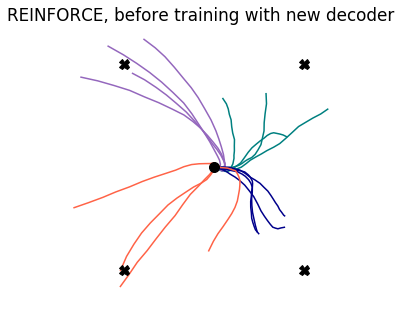

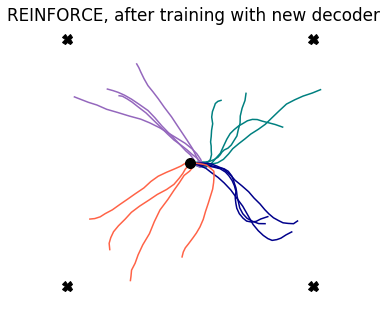

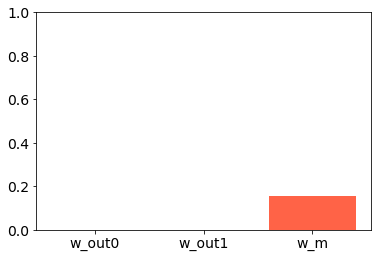

10it [00:00, 93.72it/s]


~~~~ OVERLAP 1, SEED 33


M norm: 1.52	 M angle: 0.51, 53 iterations
w_out1 norm: 0.00	 w_out vs. w_out1 angle: 1.00
w_m norm: 1.52	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.52	 w_out vs. w_m angle: 0.51

500it [00:04, 123.73it/s]
6000it [00:59, 100.84it/s]
500it [00:04, 123.37it/s]


AR early fit 0.933, late fit 0.937


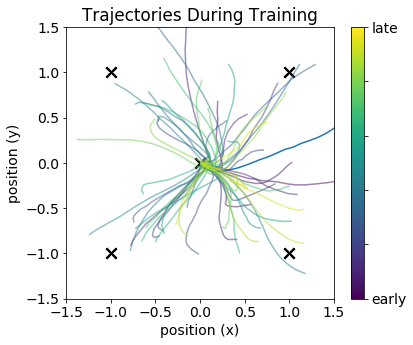

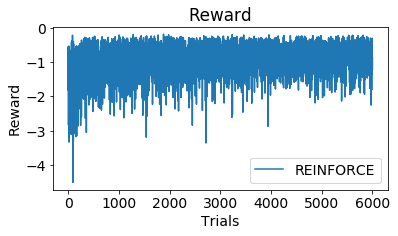

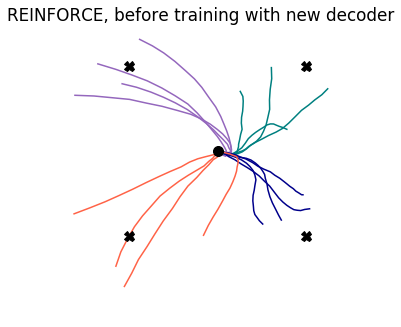

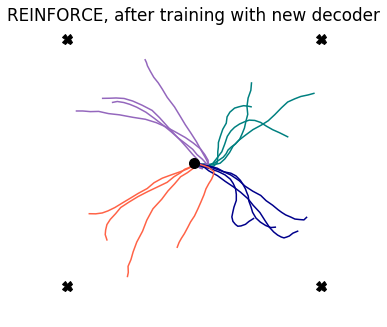

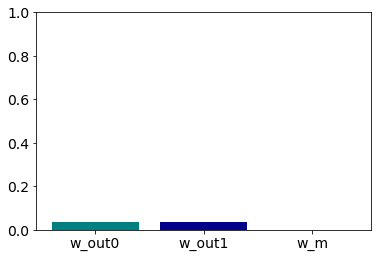

7it [00:00, 62.49it/s]


~~~~ OVERLAP 0.2, SEED 47


M norm: 0.97	 M angle: 0.50, 13 iterations
w_out1 norm: 1.76	 w_out vs. w_out1 angle: 0.20
w_m norm: 0.97	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.90	 w_out vs. w_m angle: 0.03

500it [00:04, 120.55it/s]
6000it [00:57, 104.82it/s]
500it [00:04, 107.96it/s]


AR early fit 0.933, late fit 0.959


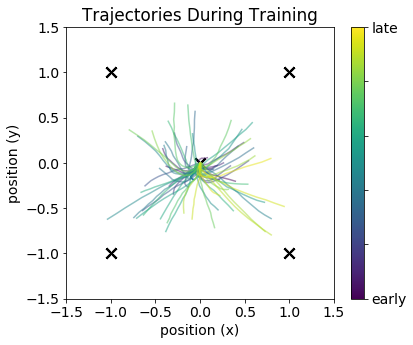

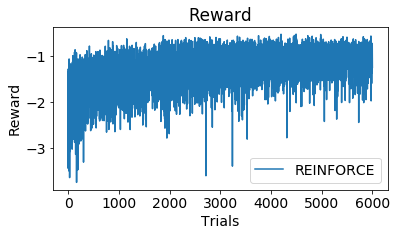

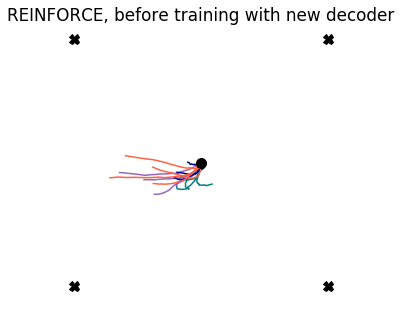

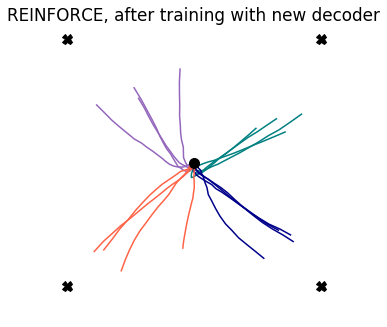

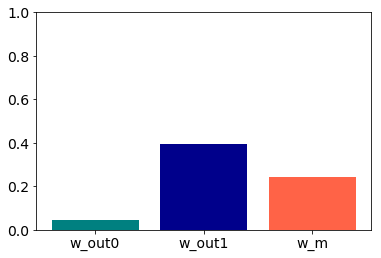

8it [00:00, 74.19it/s]


~~~~ OVERLAP 0.3, SEED 47


M norm: 1.01	 M angle: 0.50, 20 iterations
w_out1 norm: 1.68	 w_out vs. w_out1 angle: 0.31
w_m norm: 1.01	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.92	 w_out vs. w_m angle: 0.01

500it [00:05, 98.68it/s] 
6000it [00:58, 101.90it/s]
500it [00:04, 123.15it/s]


AR early fit 0.933, late fit 0.954


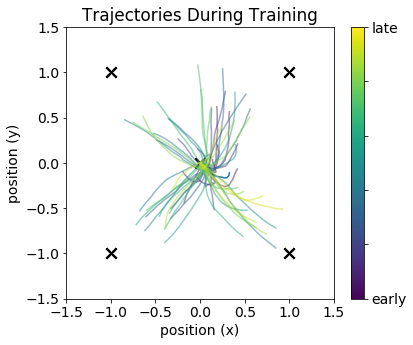

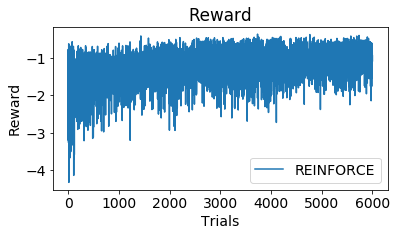

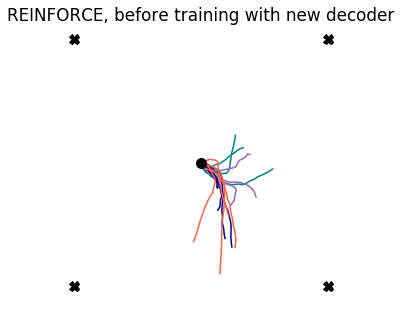

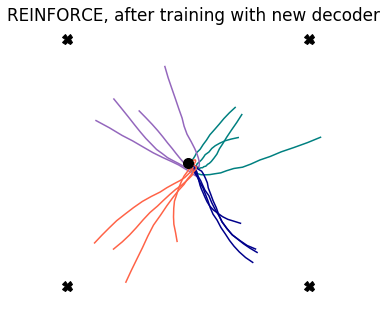

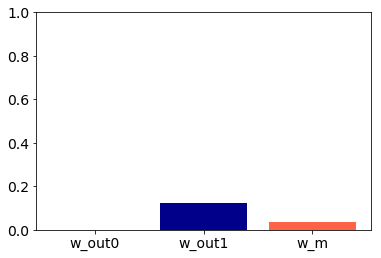

10it [00:00, 96.15it/s]


~~~~ OVERLAP 0.4, SEED 47


M norm: 1.11	 M angle: 0.49, 6 iterations
w_out1 norm: 1.61	 w_out vs. w_out1 angle: 0.41
w_m norm: 1.11	 w_out1 vs. w_m angle: 0.49
w_m norm: 1.75	 w_out vs. w_m angle: 0.20

500it [00:04, 122.79it/s]
6000it [00:58, 103.22it/s]
500it [00:04, 123.10it/s]


AR early fit 0.933, late fit 0.953


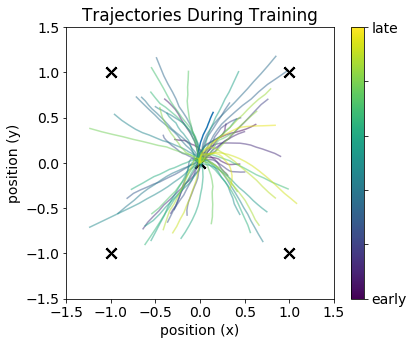

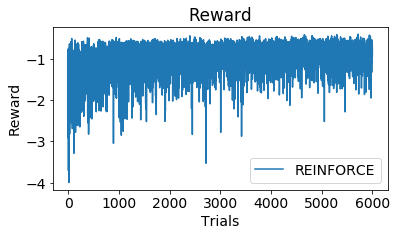

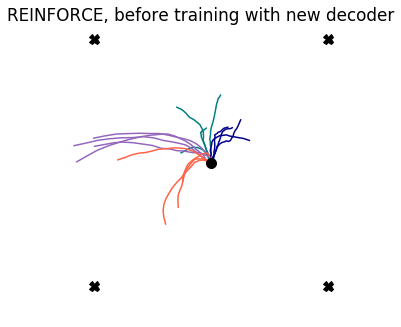

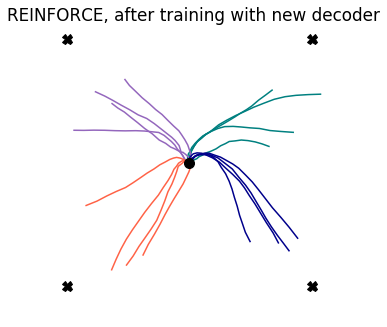

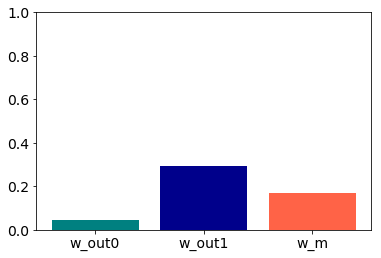

11it [00:00, 109.25it/s]


~~~~ OVERLAP 0.5, SEED 47


M norm: 1.09	 M angle: 0.50, 2 iterations
w_out1 norm: 1.47	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.09	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.76	 w_out vs. w_m angle: 0.19

500it [00:04, 123.14it/s]
6000it [00:56, 105.62it/s]
500it [00:04, 123.15it/s]


AR early fit 0.933, late fit 0.955


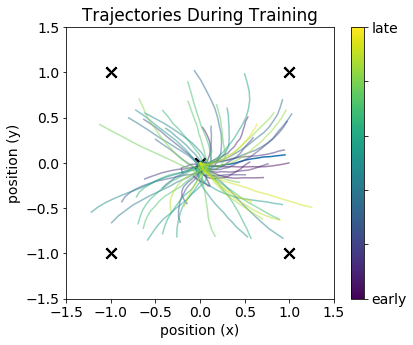

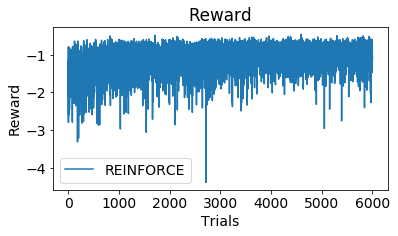

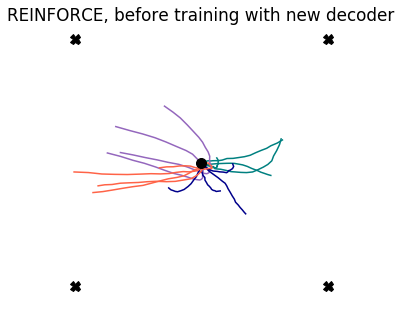

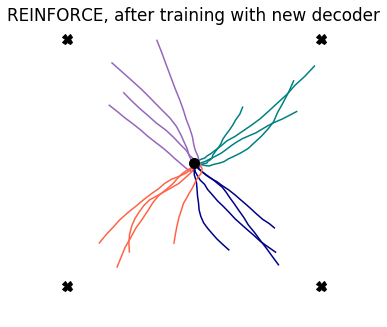

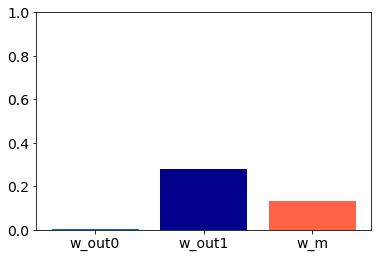

9it [00:00, 83.11it/s]


~~~~ OVERLAP 0.6, SEED 47


M norm: 1.20	 M angle: 0.50, 20 iterations
w_out1 norm: 1.36	 w_out vs. w_out1 angle: 0.61
w_m norm: 1.20	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.79	 w_out vs. w_m angle: 0.19

500it [00:05, 86.99it/s]
6000it [00:57, 104.59it/s]
500it [00:04, 123.56it/s]


AR early fit 0.933, late fit 0.952


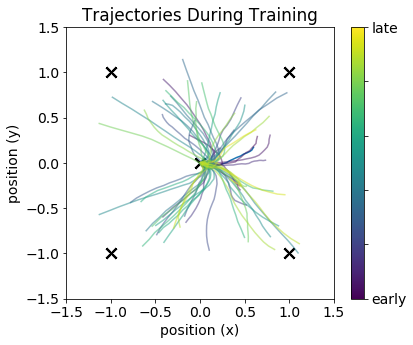

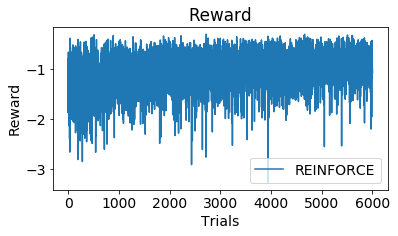

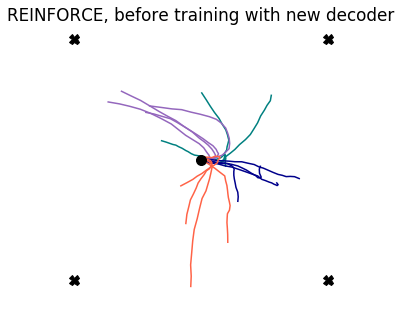

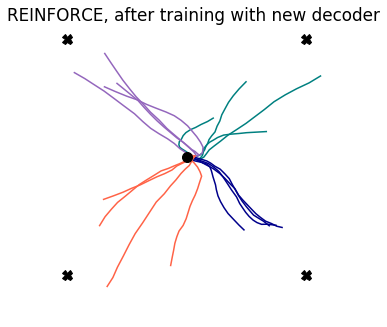

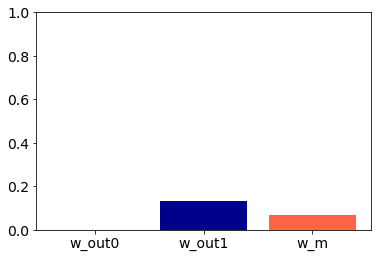

11it [00:00, 106.54it/s]


~~~~ OVERLAP 0.7, SEED 47


M norm: 1.18	 M angle: 0.49, 5 iterations
w_out1 norm: 1.19	 w_out vs. w_out1 angle: 0.70
w_m norm: 1.18	 w_out1 vs. w_m angle: 0.49
w_m norm: 1.61	 w_out vs. w_m angle: 0.36

500it [00:04, 103.94it/s]
6000it [00:59, 100.28it/s]
500it [00:04, 111.56it/s]


AR early fit 0.933, late fit 0.943


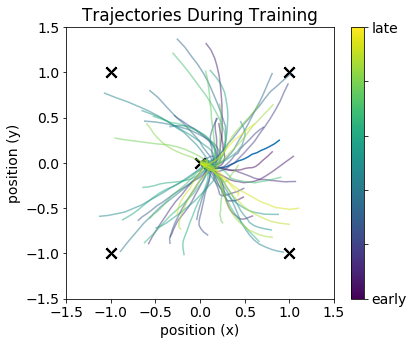

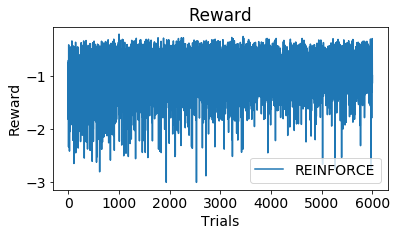

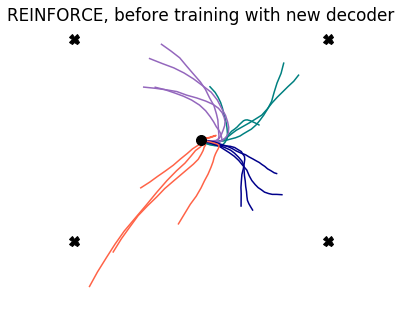

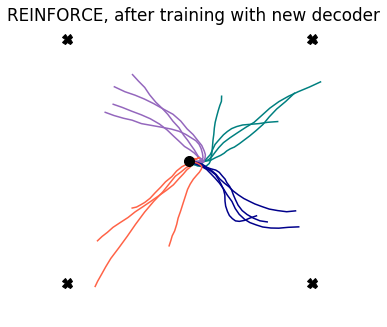

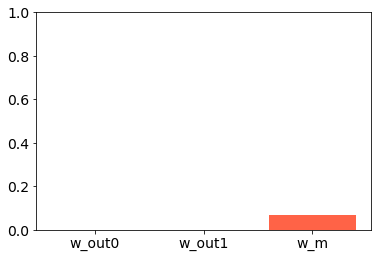

11it [00:00, 103.87it/s]


~~~~ OVERLAP 0.8, SEED 47


M norm: 1.35	 M angle: 0.50, 13 iterations
w_out1 norm: 1.02	 w_out vs. w_out1 angle: 0.80
w_m norm: 1.35	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.57	 w_out vs. w_m angle: 0.43

500it [00:04, 121.78it/s]
6000it [00:57, 104.93it/s]
500it [00:04, 123.49it/s]


AR early fit 0.933, late fit 0.937


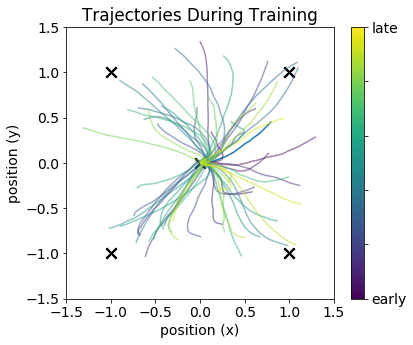

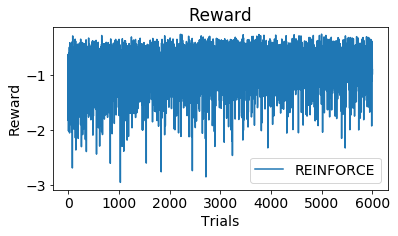

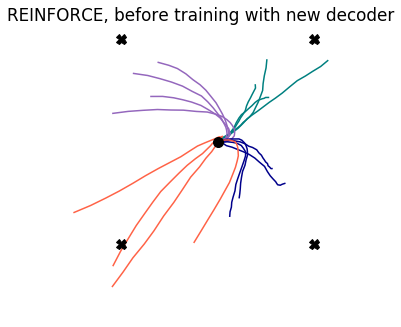

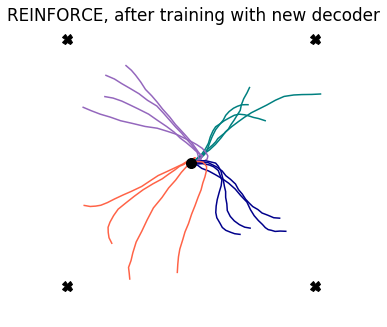

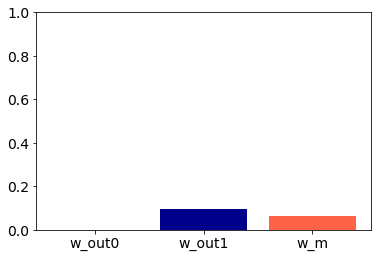

6it [00:00, 59.33it/s]


~~~~ OVERLAP 0.9, SEED 47


M norm: 1.42	 M angle: 0.51, 154 iterations
w_out1 norm: 0.70	 w_out vs. w_out1 angle: 0.91
w_m norm: 1.42	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.57	 w_out vs. w_m angle: 0.45

500it [00:04, 123.16it/s]
6000it [00:57, 103.60it/s]
500it [00:04, 123.55it/s]


AR early fit 0.933, late fit 0.936


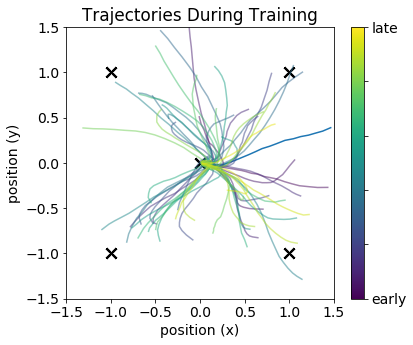

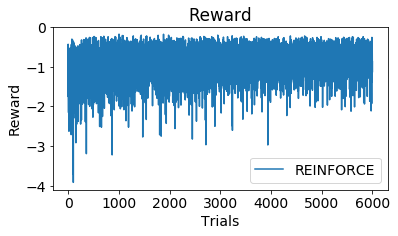

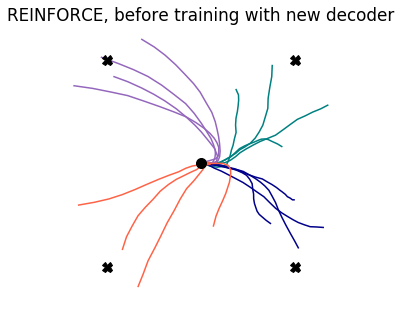

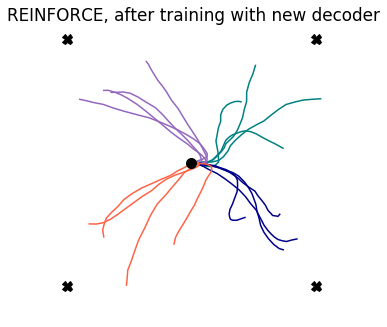

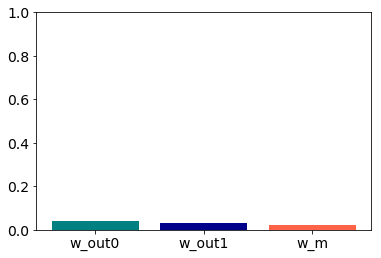

8it [00:00, 79.95it/s]


~~~~ OVERLAP 1, SEED 47


M norm: 1.52	 M angle: 0.51, 53 iterations
w_out1 norm: 0.00	 w_out vs. w_out1 angle: 1.00
w_m norm: 1.52	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.52	 w_out vs. w_m angle: 0.51

500it [00:04, 125.16it/s]
6000it [00:57, 104.32it/s]
500it [00:04, 123.83it/s]


AR early fit 0.933, late fit 0.937


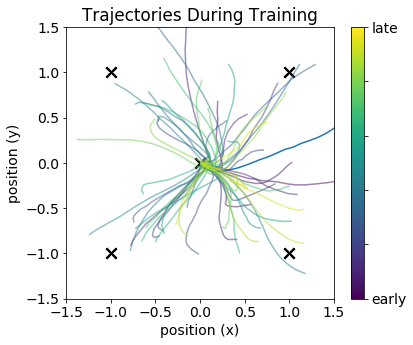

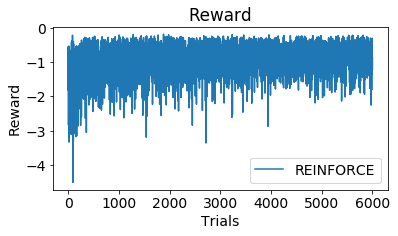

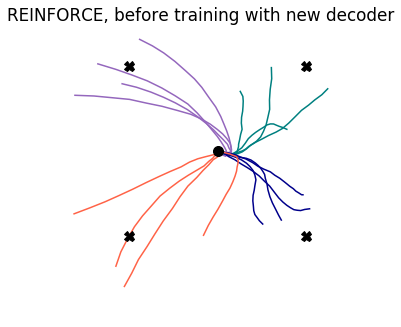

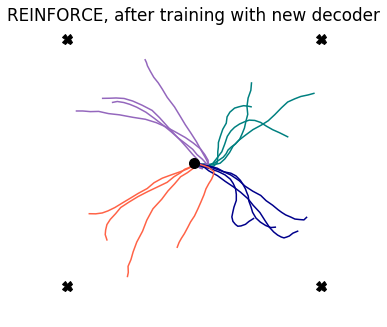

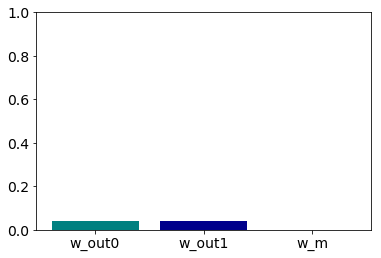

7it [00:00, 60.28it/s]


~~~~ OVERLAP 0.2, SEED 52


M norm: 1.09	 M angle: 0.49, 11 iterations
w_out1 norm: 1.81	 w_out vs. w_out1 angle: 0.21
w_m norm: 1.09	 w_out1 vs. w_m angle: 0.49
w_m norm: 1.83	 w_out vs. w_m angle: 0.13

500it [00:05, 96.52it/s]
6000it [00:58, 102.75it/s]
500it [00:04, 122.77it/s]


AR early fit 0.933, late fit 0.956


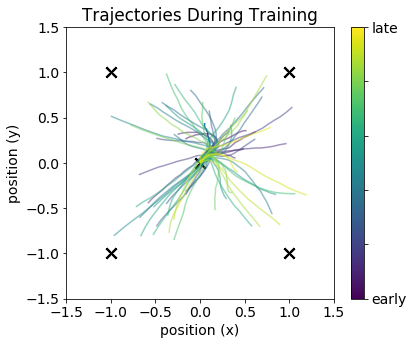

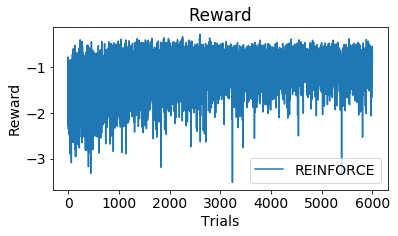

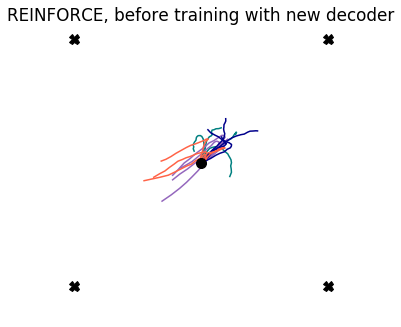

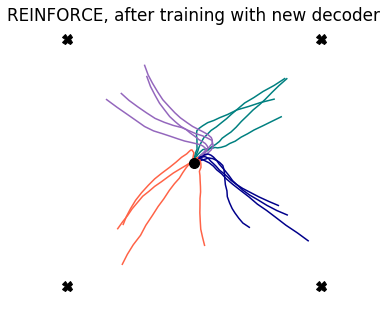

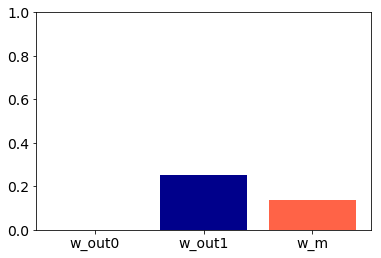

10it [00:00, 97.78it/s]


~~~~ OVERLAP 0.3, SEED 52


M norm: 0.97	 M angle: 0.50, 7 iterations
w_out1 norm: 1.67	 w_out vs. w_out1 angle: 0.30
w_m norm: 0.97	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.70	 w_out vs. w_m angle: 0.23

500it [00:04, 114.94it/s]
6000it [00:57, 104.19it/s]
500it [00:04, 123.21it/s]


AR early fit 0.933, late fit 0.958


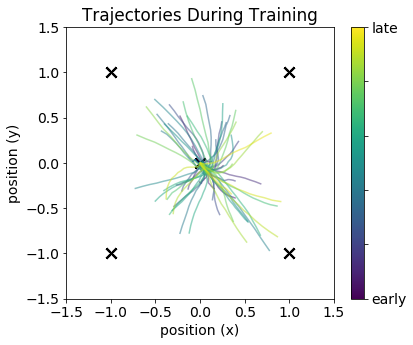

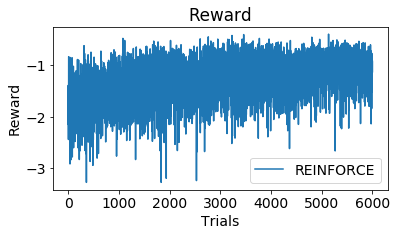

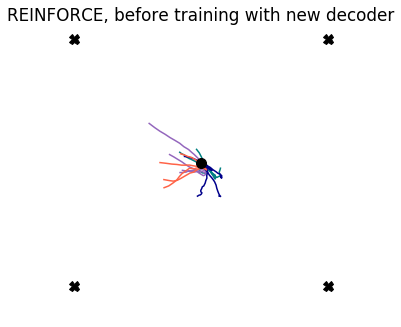

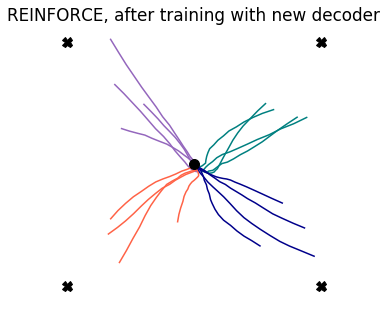

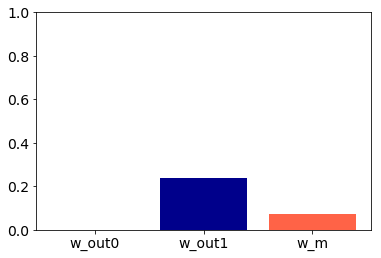

7it [00:00, 62.40it/s]


~~~~ OVERLAP 0.4, SEED 52


M norm: 1.10	 M angle: 0.49, 32 iterations
w_out1 norm: 1.62	 w_out vs. w_out1 angle: 0.39
w_m norm: 1.10	 w_out1 vs. w_m angle: 0.49
w_m norm: 1.82	 w_out vs. w_m angle: 0.12

500it [00:04, 118.32it/s]
6000it [00:57, 104.56it/s]
500it [00:04, 118.60it/s]


AR early fit 0.933, late fit 0.954


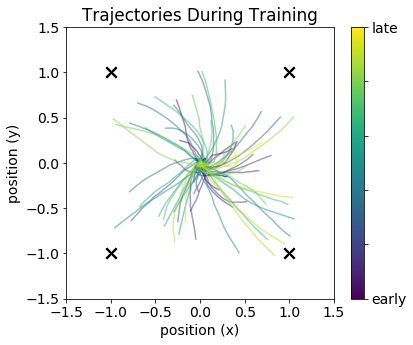

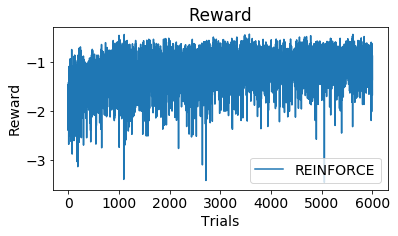

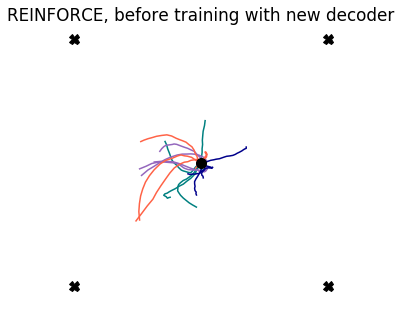

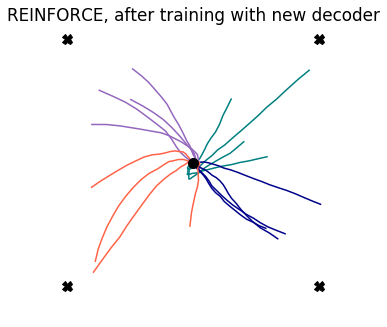

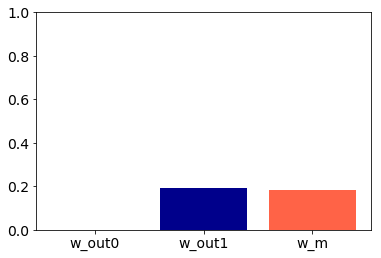

10it [00:00, 91.78it/s]


~~~~ OVERLAP 0.5, SEED 52


M norm: 1.11	 M angle: 0.49, 4 iterations
w_out1 norm: 1.48	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.11	 w_out1 vs. w_m angle: 0.49
w_m norm: 1.60	 w_out vs. w_m angle: 0.37

500it [00:04, 122.71it/s]
6000it [00:57, 103.66it/s]
500it [00:04, 120.95it/s]


AR early fit 0.933, late fit 0.955


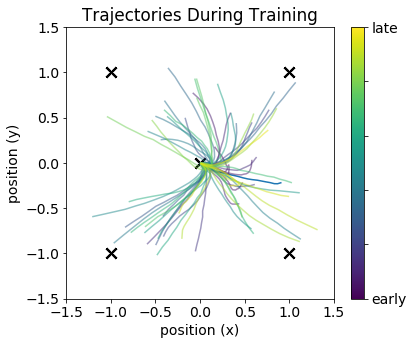

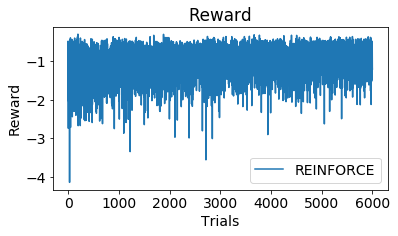

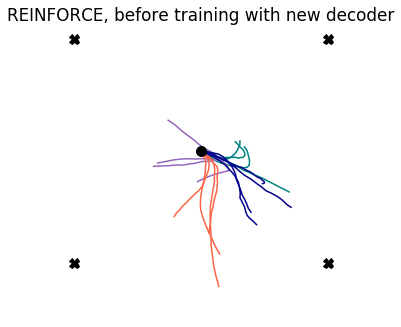

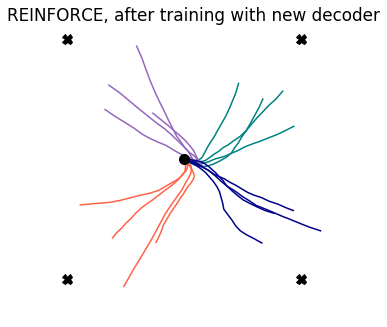

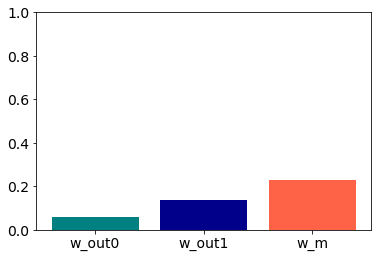

9it [00:00, 83.76it/s]


~~~~ OVERLAP 0.6, SEED 52


M norm: 1.16	 M angle: 0.51, 75 iterations
w_out1 norm: 1.37	 w_out vs. w_out1 angle: 0.59
w_m norm: 1.16	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.76	 w_out vs. w_m angle: 0.22

500it [00:04, 122.13it/s]
6000it [00:56, 105.46it/s]
500it [00:04, 122.92it/s]


AR early fit 0.933, late fit 0.954


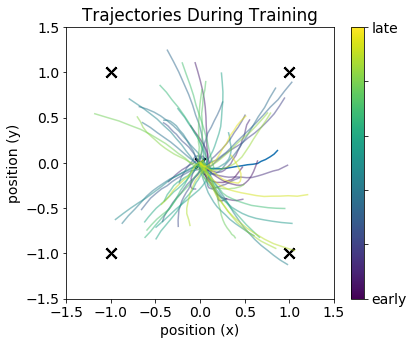

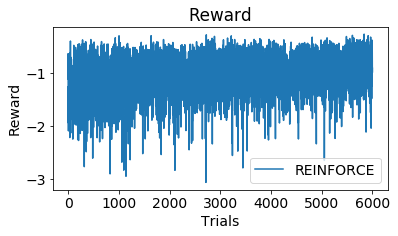

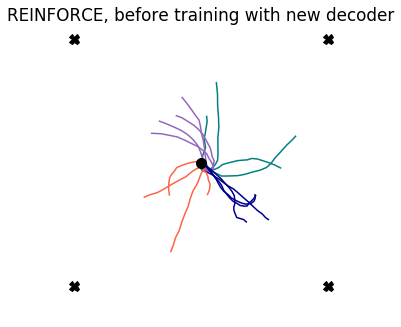

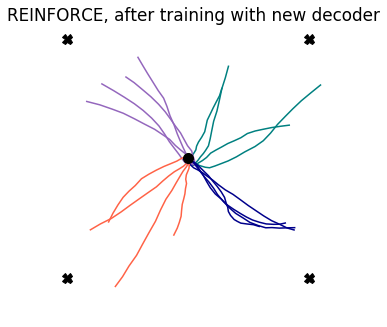

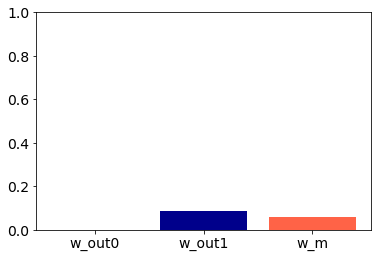

8it [00:00, 77.26it/s]


~~~~ OVERLAP 0.7, SEED 52


M norm: 1.27	 M angle: 0.50, 44 iterations
w_out1 norm: 1.21	 w_out vs. w_out1 angle: 0.70
w_m norm: 1.27	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.55	 w_out vs. w_m angle: 0.43

500it [00:05, 85.77it/s]
6000it [00:58, 103.03it/s]
500it [00:04, 123.07it/s]


AR early fit 0.933, late fit 0.942


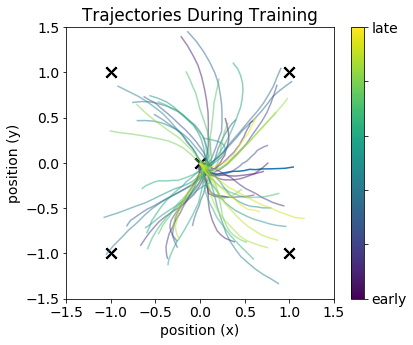

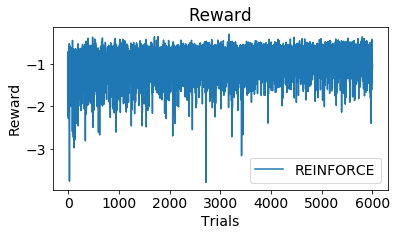

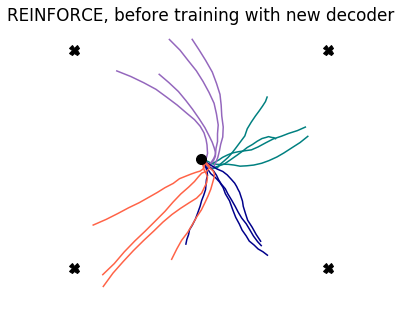

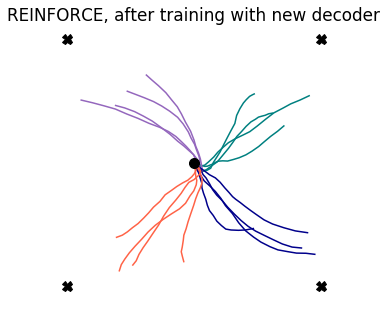

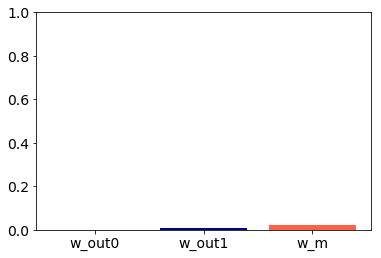

10it [00:00, 93.93it/s]


~~~~ OVERLAP 0.8, SEED 52


M norm: 1.38	 M angle: 0.49, 26 iterations
w_out1 norm: 1.01	 w_out vs. w_out1 angle: 0.80
w_m norm: 1.38	 w_out1 vs. w_m angle: 0.49
w_m norm: 1.59	 w_out vs. w_m angle: 0.42

500it [00:04, 122.23it/s]
6000it [00:57, 106.45it/s]
500it [00:04, 112.52it/s]


AR early fit 0.933, late fit 0.937


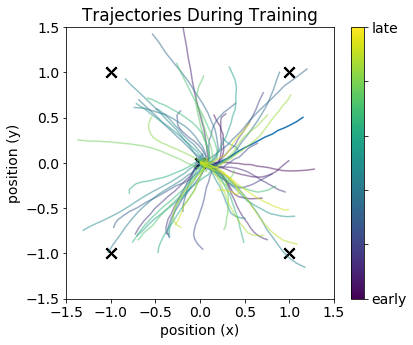

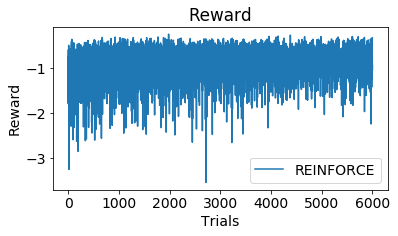

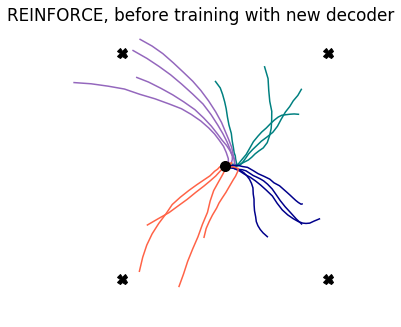

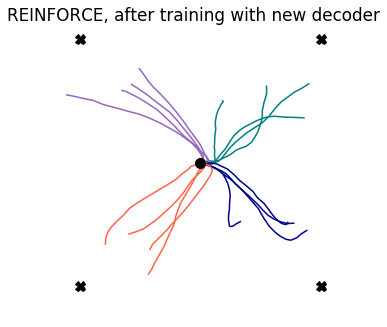

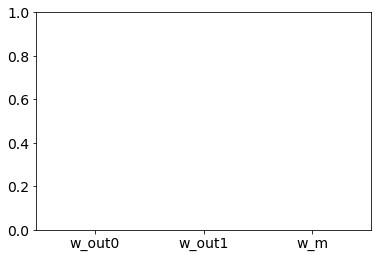

9it [00:00, 80.15it/s]


~~~~ OVERLAP 0.9, SEED 52


M norm: 1.38	 M angle: 0.50, 10 iterations
w_out1 norm: 0.70	 w_out vs. w_out1 angle: 0.91
w_m norm: 1.38	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.54	 w_out vs. w_m angle: 0.46

500it [00:04, 121.21it/s]
6000it [00:56, 105.32it/s]
500it [00:04, 122.90it/s]


AR early fit 0.933, late fit 0.935


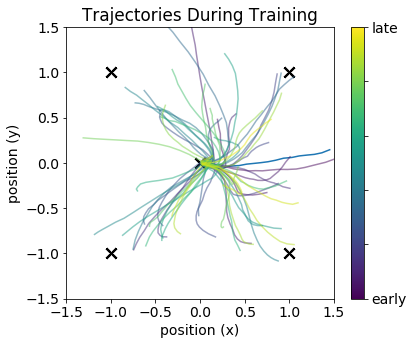

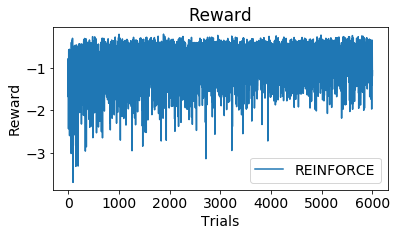

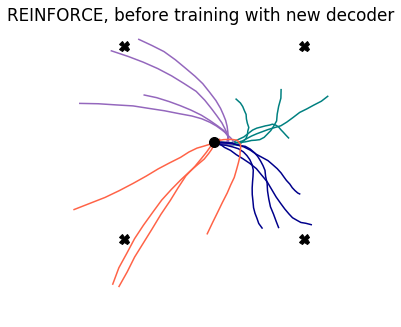

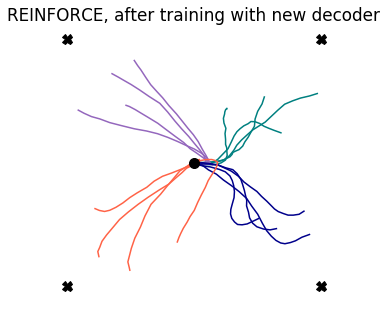

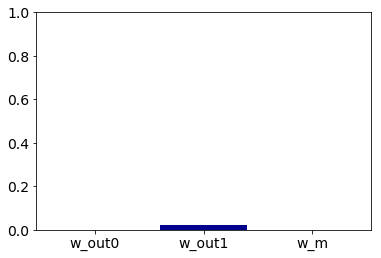

10it [00:00, 98.01it/s]


~~~~ OVERLAP 1, SEED 52


M norm: 1.52	 M angle: 0.51, 53 iterations
w_out1 norm: 0.00	 w_out vs. w_out1 angle: 1.00
w_m norm: 1.52	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.52	 w_out vs. w_m angle: 0.51

500it [00:04, 122.59it/s]
6000it [00:58, 102.76it/s]
500it [00:04, 123.75it/s]


AR early fit 0.933, late fit 0.937


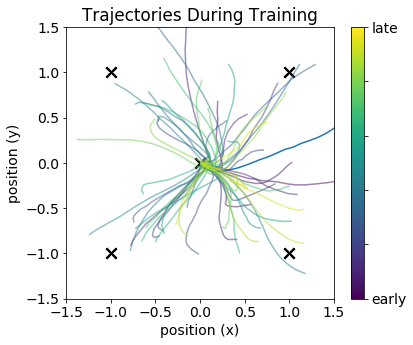

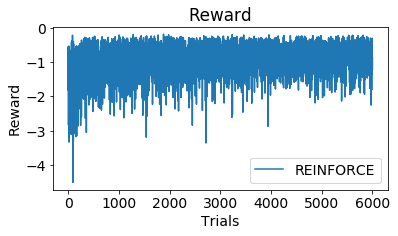

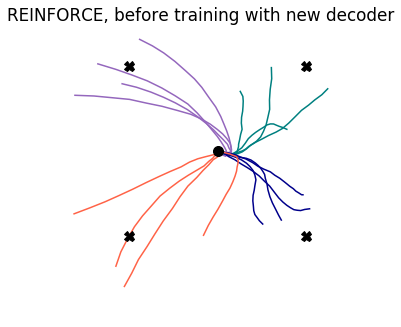

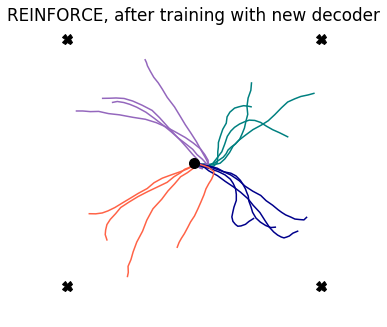

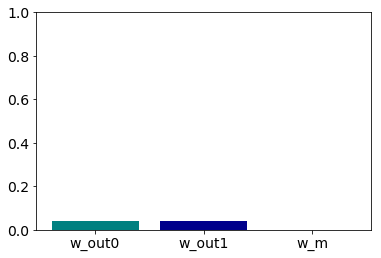

In [6]:
pretrain_duration = 3000
train_duration = 6000
test_duration = 500

# Set RNN Parameters
params = RNNparams(n_in=4,n_rec=50,n_out=2,tau_rec=10,
               eta_in=0.1,eta_rec=0.1,eta_out=0.1,
               sig_in=0.0,sig_rec=0.25,sig_out=0.01,
               velocity_transform=True, tau_vel = 0.8, dt_vel = 0.1,
               rng=np.random.RandomState(72))
params.print_params()

# Initialize RNN, train with RFLO
net0 = RNN(params)
sim0 = Simulation(net0)
rflo = RFLO(net0,apply_to=['w_rec'],online=False)
sim0.run_session(n_trials=pretrain_duration, tasks=[task1,task2,task3,task4], learn_alg=[rflo], probe_types=['loss'], plot=True, plot_freq=20)

fig0 = plot_trained_trajectories(sim=sim0, tasks=[task1,task2,task3,task4],title='Pretrain RFLO, train '+r'$W_{rec}$')



""" Average over multiple seeds """
seeds = [0,22,33,47,52]
overlaps = [0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]
n_changes = [75,75,60,50,50,50,30,30,1]

overlap_w_m = 0.5
n_change_w_m = 50


stats = {}
stats['corr1'] = []
stats['corr2'] = []
stats['corr3'] = []
stats['corrcoef'] = []

stats['seeds'] = seeds
stats['overlaps'] = overlaps
stats['n_changes'] = n_changes
stats['overlap_w_m'] = overlap_w_m
stats['train_duration'] = train_duration
stats['test_duration'] = test_duration


for seed in seeds:

    corr1_list = []
    corr2_list = []
    corr3_list = []
    corrcoef_list = []
    
    covariance1_list = []
    covariance2_list = []
    covariance3_list = []

    for overlap,n_change in zip(overlaps,n_changes):
        
        print('\n~~~~ OVERLAP {}, SEED {}'.format(overlap,seed))
        print('\n')
        
        """ choose new decoder w_out1, change overlap """
        w_out1 = choose_aligned_matrix(net0.w_out.copy(),n_change=n_change,overlap=overlap,rng=np.random.RandomState(seed),zero=False,tolerance=0.01,loop=1000)
        """ choose new internal model w_m, keep constant """
        w_m = choose_aligned_matrix(w_out1.copy(),n_change=n_change_w_m,overlap=overlap_w_m,rng=np.random.RandomState(seed*seeds[0]),zero=False,tolerance=0.01,loop=1000)

        # confirm overlap between w_out1 and w_out
        norm, angle = return_norm_and_angle(net0.w_out,w_out1)
        print('\nw_out1 norm: {:.2f}'.format(norm) + '\t w_out vs. w_out1 angle: {:.2f}'.format(angle),end='')

        # confirm overlap between w_out1 and w_m
        norm, angle = return_norm_and_angle(w_out1,w_m)
        print('\nw_m norm: {:.2f}'.format(norm) + '\t w_out1 vs. w_m angle: {:.2f}'.format(angle),end='')

        # confirm overlap between w_out and w_m
        norm, angle = return_norm_and_angle(net0.w_out,w_m)
        print('\nw_m norm: {:.2f}'.format(norm) + '\t w_out vs. w_m angle: {:.2f}'.format(angle),end='')
        
        
        
        
        net2_pre = RNN(params)
        net2_pre.set_weights(w_in=net0.w_in.copy(), w_rec=net0.w_rec.copy())
        net2_pre.set_weights(w_out = w_out1)
        net2_pre.set_weights(w_m = 0*w_m.T) # shouldn't matter for REINFORCE

        # unfortunately I need to make a different network to maintain integrity of pre and post simulations for plotting
        net2 = RNN(params)
        net2.set_weights(w_in=net0.w_in.copy(), w_rec=net0.w_rec.copy())
        net2.set_weights(w_out = w_out1)
        net2.set_weights(w_m = 0*w_m.T) # shouldn't matter for REINFORCE



        """ Track activity with new decoder, before training """

        sim2_pre = Simulation(net2_pre)
        trackvars = TrackVars(net2_pre,apply_to=[]) 
        sim2_pre.run_session(n_trials=test_duration, tasks=[task1,task2,task3,task4], learn_alg=[trackvars], probe_types=['h','err'], plot=False, plot_freq=10)
        #fig = plot_trained_trajectories(sim=sim1_pre, tasks=[task1,task2,task3,task4],title='RFLO, before training with new decoder')

        """ Train with new decoder """

        sim2_train = Simulation(net2)
        reinforce = REINFORCE(net2,apply_to=['w_rec'],online=False,tau_reward=5,error_fn='velocity')
        sim2_train.run_session(n_trials=train_duration, tasks=[task1,task2,task3,task4], learn_alg=[reinforce], probe_types=['h','reward','err'], plot=True, plot_freq=100)

        """ Track activity with new decoder, after training """
        net2_post = RNN(params)
        net2_post.set_weights(w_in=net2.w_in.copy(), w_rec=net2.w_rec.copy())
        net2_post.set_weights(w_out = net2.w_out)
        net2_post.set_weights(w_m = 0*net2.w_m) # shouldn't matter for REINFORCE

        sim2_post = Simulation(net2_post)
        trackvars = TrackVars(net2_post,apply_to=[]) 
        sim2_post.run_session(n_trials=test_duration, tasks=[task1,task2,task3,task4], learn_alg=[trackvars], probe_types=['h','err'], plot=False, plot_freq=10)

        
        fig = plot_trained_trajectories(sim=sim2_pre, tasks=[task1,task2,task3,task4],title='REINFORCE, before training with new decoder')

        fig = plot_trained_trajectories(sim=sim2_post, tasks=[task1,task2,task3,task4],title='REINFORCE, after training with new decoder')
        
        
        """ Calculate F fields """
        F_early, score_early = flow_field_data(sim2_pre.session_probes['h'])
        F_late, score_late = flow_field_data(sim2_post.session_probes['h'])

        print('AR early fit {:.3f}, late fit {:.3f}'.format(score_early,score_late))

        Fdata = F_late - F_early

        # separate train and test data from sim1_train
        n_total = len(sim2_train.session_probes['h'])
        n_train = int(0.5 * n_total)
        idx_train = np.random.RandomState(1975+seed).choice(np.arange(0,n_total),size=n_train,replace=False).astype(int)
        idx_test = np.arange(0,n_total)[~idx_train].astype(int)
        #idx_test=idx_train

        h_train = np.asarray(sim2_train.session_probes['h'])[idx_train,:,:,:]
        err_train = np.asarray(sim2_train.session_probes['err'])[idx_train,:,:,:]

        Fpred_w_out = flow_field_predicted(net0.w_out,err_train,h_train)
        Fpred_w_out1 = flow_field_predicted(w_out1,err_train,h_train)
        Fpred_w_m = flow_field_predicted(w_m,err_train,h_train)

        h_test = np.asarray(sim2_train.session_probes['h'])[idx_test,:,:,:]

        corr1 = calculate_flow_field_correlation(Fpred_w_out,Fdata,h_test) # could also sample sim_test
        corr1_list.append(corr1)

        corr2 = calculate_flow_field_correlation(Fpred_w_out1,Fdata,h_test) # could also sample sim_test
        corr2_list.append(corr2)

        corr3 = calculate_flow_field_correlation(Fpred_w_m,Fdata,h_test) # could also sample sim_test
        corr3_list.append(corr3)
        
        fig,ax = plt.subplots(1,1)
        plt.bar([0,1,2],[corr1,corr2,corr3],tick_label=['w_out0','w_out1','w_m'],color=['teal','darkblue','tomato'])
        plt.ylim([0,1])
        plt.show()
        
        
        
    # update
    stats['corr1'].append(corr1_list)
    stats['corr2'].append(corr2_list)
    stats['corr3'].append(corr3_list)
    #stats['corrcoef'].append(corrcoef_list)
    


In [7]:
""" save dict with unique name """
stats_vel_m = stats

""" save dict """

save = True
tag = 'sup-vel-vel-5-26-large'


if save:
    
    with open(folder+'stats_vel_reinforce_m-'+tag+'.pickle', 'wb') as handle:
        pickle.dump(stats_vel_m, handle, protocol=pickle.HIGHEST_PROTOCOL)
        
    print('\nsaved as '+folder+'stats_vel_reinforce_m-'+tag+'.pickle')
    print('HOORAY IT WORKED')



saved as figs-2022-5-26/stats_vel_reinforce_m-sup-vel-vel-5-26-large.pickle
HOORAY IT WORKED


In [8]:
""" Load REINFORCE version for same hyperparameters """

filename='../NeurIPS-2022-4-29/figures-2022-5-05/stats_reinforce_wout.pickle'

with open(filename, 'rb') as fp:
    stats_reinforce_wout = pickle.load(fp)
    
    
overlaps_old = [0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]
print('>>old traces loaded\n')

>>old traces loaded



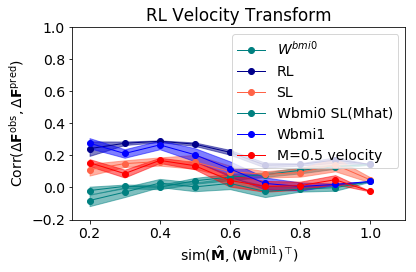

>> Made it to here as well! It plotted!


In [10]:
""" Same plot using flow field """
paper = False
save = False

fig,ax = plt.subplots(1,1,figsize=(6,4))

""" Baseline Result from Main Figure """
n_samples = len(stats_reinforce_wout['corr1'])
mn1 = np.mean(np.asarray(stats_reinforce_wout['corr1']),axis=0)
std1 = np.std(np.asarray(stats_reinforce_wout['corr1']),axis=0)
sem1 = std1/np.sqrt(n_samples)

mn2 = np.mean(np.asarray(stats_reinforce_wout['corr2']),axis=0)
std2 = np.std(np.asarray(stats_reinforce_wout['corr2']),axis=0)
sem2 = std2/np.sqrt(n_samples)

mn3 = np.mean(np.asarray(stats_reinforce_wout['corr3']),axis=0)
std3 = np.std(np.asarray(stats_reinforce_wout['corr3']),axis=0)
sem3 = std3/np.sqrt(n_samples)

""" velocity transform """
n_samples = len(stats_vel_m['corr1'])
mn4 = np.mean(np.asarray(stats_vel_m['corr1']),axis=0)
std4 = np.std(np.asarray(stats_vel_m['corr1']),axis=0)
sem4 = std4/np.sqrt(n_samples)

mn5 = np.mean(np.asarray(stats_vel_m['corr2']),axis=0)
std5 = np.std(np.asarray(stats_vel_m['corr2']),axis=0)
sem5 = std5/np.sqrt(n_samples)

mn6 = np.mean(np.asarray(stats_vel_m['corr3']),axis=0)
std6 = np.std(np.asarray(stats_vel_m['corr3']),axis=0)
sem6 = std6/np.sqrt(n_samples)




plt.plot(overlaps_old,mn1,'o-',linewidth=1,label=r'$W^{bmi0}$',color='teal')
plt.fill_between(overlaps_old,mn1-sem1,mn1+sem1,alpha=0.5,color='teal')

plt.plot(overlaps_old,mn2,'o-',linewidth=1,label='RL',color='darkblue')
plt.fill_between(overlaps_old,mn2-sem2,mn2+sem2,alpha=0.5,color='darkblue')

plt.plot(overlaps_old,mn3,'o-',linewidth=1,label='SL',color='tomato')
plt.fill_between(overlaps_old,mn3-sem3,mn3+sem3,alpha=0.5,color='tomato')

plt.plot(overlaps,mn4,'o-',linewidth=1,label='Wbmi0 SL(Mhat)',color='teal')
plt.fill_between(overlaps,mn4-sem4,mn4+sem4,alpha=0.5,color='teal')

plt.plot(overlaps,mn5,'o-',linewidth=1,label='Wbmi1',color='blue')
plt.fill_between(overlaps,mn5-sem5,mn5+sem5,alpha=0.5,color='blue')

plt.plot(overlaps,mn6,'o-',linewidth=1,label='M=0.5 velocity',color='red')
plt.fill_between(overlaps,mn6-sem6,mn6+sem6,alpha=0.5,color='red')


plt.ylim([-0.2,1])
plt.xlim([0.15,1.1])
plt.legend()
plt.title('RL Velocity Transform')
plt.xlabel('sim('+r'$\mathbf{\hat{M}},(\mathbf{W}^{\mathrm{bmi1}})^\top)$')
plt.ylabel('Corr'+r'$(\Delta \mathbf{F}^{\mathrm{obs}}, \Delta \mathbf{F}^{\mathrm{pred}})$')

plt.tight_layout()

if paper:
    fig,ax = paper_format(fig=fig,ax=ax,xlabels=[0.2,0.4,0.5,0.6,0.7,0.8,0.9,1],ylabels=[0,0.25,0.5,0.75,1],ticksize=10,linewidth=2,ylim=[-.15,0.75],figsize=(2.25,3))

plt.show()

if save:
    if paper:
        fig.savefig(folder+'sup-vel-reinforce-change-m-full.pdf')
    else:
        fig.savefig(folder+'sup-vel-reinforce-change-m_full.pdf')
        
print('>> Made it to here as well! It plotted!')


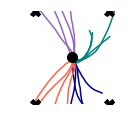

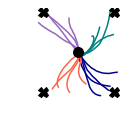

In [30]:
""" Example traces """

paper = True
save = False

fig0 = plot_trained_trajectories(sim=sim2_pre, tasks=[task1,task2,task3,task4],title='')

fig1 = plot_trained_trajectories(sim=sim2_post, tasks=[task1,task2,task3,task4],title='')

if paper:
    fig0,_ = paper_format(fig=fig0,ax=fig0.gca(),xlabels=None,ylabels=None,ticksize=10,linewidth=2,ylim=[-1,1],figsize=(2,2))
    fig1,_ = paper_format(fig=fig1,ax=fig0.gca(),xlabels=None,ylabels=None,ticksize=10,linewidth=2,ylim=[-1,1],figsize=(2,2))

if save:
    
    fig1.savefig(folder+'sup-vel-reinforce-example.pdf')